## Setup

## Title 

### Building Accurate Models for Unit Sales Prediction in Favorita Stores using Time Series Forecasting

### Description of the project 

A time series is a sequence of data points that are indexed and ordered chronologically over time. Time series data can be observed at regular or irregular intervals and can be collected over any time period, ranging from seconds to decades or even centuries. Time series data can be univariate (i.e., a single variable is recorded over time) or multivariate (i.e., multiple variables are recorded over time).Favorita Corporation is an Ecuadorian company that creates and invests in the commercial, industrial and real estate areas. Its subsidiaries have activities in six countries in the region, including Panama, Paraguay, Peru, Colombia, Costa Rica and Chile. They offer the best products, services and experiences in an efficient, sustainable and responsible way to improve the quality of life. 

The aim of this project is to forecast the unit sales of the products across different stores. This is to optimize their inventory management , marketing strategies  and pricing  decisions. To achieve this results, we employed the use of time series in collaboration with different machine learning algorithms via the CRISP-DM framework. 

The objective of this analysis is to select the best prediction model from the different ML algorithms tested. This model will be the solution to be adopted by the company to help Favorita Corporation make insightful decisions in relation to their retail sales ,promotion and customer statisfaction. 

### Hypothesis 

- Null Hypothesis:
Promotional activities have a significant impact on the store sales at Corporation Favorita.

- Alternate Hypothesis:
Promotional activities does not have a significant impact on the store sales at Corporation Favorita.


### Questions 

Q1. which city had the highest stores

Q2. which month did we have the highest sale

Q3. which store had the highest transaction?

Q4. which store had the highest sale?

Q5. what is the most bought product?

### Installation

In [1]:
# Summarytools installed 
# Pandas installed 
#Matplotlib installed 
#Seaborn Installed
#Numpy installed 

### Importation

Here is the section to import all the packages/libraries that will be used through this notebook.

In [2]:
# Data handling
import pandas as pd 
import numpy as np
# Vizualisation (Matplotlib, Plotly, Seaborn, etc. )
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as ex
import plotly.offline as po
import plotly.graph_objects as go
from matplotlib import dates as mpl_dates
from datetime import datetime
# EDA (pandas-profiling, etc. )
...

# Feature Processing (Scikit-learn processing, etc. )
...

# Machine Learning (Scikit-learn Estimators, Catboost, LightGBM, etc. )
...
import statsmodels.api as sma

from statsmodels.graphics.tsaplots import plot_acf as ACF
from statsmodels.graphics.tsaplots import plot_pacf as PACF

from sklearn.model_selection import train_test_split
from pmdarima import auto_arima
from prophet import Prophet

# Use sklearn.impute.SimpleImputer
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_log_error

# Hyperparameters Fine-tuning (Scikit-learn hp search, cross-validation, etc. )
...

# Other packages
import os
import warnings 
warnings.filterwarnings("ignore")
import summarytools as dfSummary 

In [3]:
#pip install tensorflow

### Data Loading

Here is the section to load the datasets (train, eval, test) and the additional files

In [4]:
#Creating a function to parse our date
def convert_to_date(w):
    return datetime.strptime(w,"%Y-%m-%d")

In [5]:
# For CSV, use pandas.read_csv

holidays_events_data= pd.read_csv('../Documents/lp2/holidays_events.csv',parse_dates=['date'])
oil_data = pd.read_csv('../Documents/lp2/oil.csv',parse_dates=['date'])
sample_submission_data =pd.read_csv('../Documents/lp2/sample_submission.csv')
stores_data = pd.read_csv('../Documents/lp2/stores.csv')
test_data = pd.read_csv('../Documents/lp2/test.csv',parse_dates=['date'])
train_data = pd.read_csv('../Documents/lp2/train.csv',parse_dates=['date'])
transactions_data= pd.read_csv('../Documents/lp2/transactions.csv',parse_dates=['date'])

"""holidays_events_data = pd.read_csv("datahub\LP2\holidays_events.csv",parse_dates=['date'])
oil_data = pd.read_csv("datahub\LP2\oil.csv",parse_dates=['date'])
sample_submission_data =pd.read_csv("datahub\LP2\sample_submission.csv")
stores_data = pd.read_csv("datahub\LP2\stores.csv")
test_data = pd.read_csv("datahub/LP2/test.csv",parse_dates=['date'])
train_data = pd.read_csv("datahub/LP2/train.csv",parse_dates=['date'])
transactions_data= pd.read_csv("datahub/LP2/transactions.csv",parse_dates=['date'])
final_dataset = pd.read_csv("datahub/LP2/final_dataset.csv")"""

'holidays_events_data = pd.read_csv("datahub\\LP2\\holidays_events.csv",parse_dates=[\'date\'])\noil_data = pd.read_csv("datahub\\LP2\\oil.csv",parse_dates=[\'date\'])\nsample_submission_data =pd.read_csv("datahub\\LP2\\sample_submission.csv")\nstores_data = pd.read_csv("datahub\\LP2\\stores.csv")\ntest_data = pd.read_csv("datahub/LP2/test.csv",parse_dates=[\'date\'])\ntrain_data = pd.read_csv("datahub/LP2/train.csv",parse_dates=[\'date\'])\ntransactions_data= pd.read_csv("datahub/LP2/transactions.csv",parse_dates=[\'date\'])\nfinal_dataset = pd.read_csv("datahub/LP2/final_dataset.csv")'

### Exploratory Data Analysis: EDA

Here is the section to inspect the datasets in depth, present it, make hypotheses and think the cleaning, processing and features creation.

### Dataset overview

Have a look at the loaded datsets using the following methods: .head(), .info()

In [6]:
holidays_events_data.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [7]:
holidays_events_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB


In [8]:
holidays_events_data.shape

(350, 6)

In [9]:
oil_data.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [10]:
oil_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1218 non-null   datetime64[ns]
 1   dcoilwtico  1175 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 19.2 KB


In [11]:
oil_data.shape

(1218, 2)

In [12]:
sample_submission_data.head() 

,id,sales
0,3000888,0.0
1,3000889,0.0
2,3000890,0.0
3,3000891,0.0
4,3000892,0.0


In [13]:
sample_submission_data.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      28512 non-null  int64  
 1   sales   28512 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 445.6 KB


In [14]:
sample_submission_data.shape

(28512, 2)

In [15]:
stores_data.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [16]:
stores_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [17]:
stores_data.shape

(54, 5)

In [18]:
test_data.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [19]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           28512 non-null  int64         
 1   date         28512 non-null  datetime64[ns]
 2   store_nbr    28512 non-null  int64         
 3   family       28512 non-null  object        
 4   onpromotion  28512 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 1.1+ MB


In [20]:
test_data.shape 

(28512, 5)

In [21]:
train_data.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [22]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB


In [23]:
train_data.shape 

(3000888, 6)

In [24]:
transactions_data.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [25]:
transactions_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 1.9 MB


In [26]:
transactions_data.shape 

(83488, 3)

- Date columns with datatype as objects in the holidays_events_data,oil_data,test_data,train_data, and transcation_data were converted to datetime64[ns].

### Univariate Analysis

APPROACH:
-Identify the variable of interest
-Check for missing values in the variable
-Plot the distribution of the variable using histograms or density plots
-Compute descriptive statistics like mean, median, mode, variance, and standard deviation
-Analyze the shape of the distribution (e.g., normal, skewed, or bimodal)
-Check for outliers and extreme values
-Identify any patterns or trends in the data

#### Checking For Missing Values

In [27]:
# Counts the number of any missing values in each column
stores_data.isna().sum()

store_nbr    0
city         0
state        0
type         0
cluster      0
dtype: int64

In [28]:
# Counts the number of any missing values in each column
oil_data.isna().sum()

date           0
dcoilwtico    43
dtype: int64

It was discovered that there were 43 missing entries in the oil_data's dcoilwtico column.The method = 'bfill' was used to fill in the missing values.

In [29]:
# Filling the missing values using 'bfill' method
oil_data ['dcoilwtico']= oil_data['dcoilwtico'].fillna(method='bfill')
oil_data
# Checks if there are any missing values in a dataframe
oil_data.isnull().any()

date          False
dcoilwtico    False
dtype: bool

In [30]:
# Counts the number of any missing values in each column
holidays_events_data.isna().sum()

date           0
type           0
locale         0
locale_name    0
description    0
transferred    0
dtype: int64

In [31]:
# Checks if there are any missing values in a dataframe
train_data.isnull().any()

id             False
date           False
store_nbr      False
family         False
sales          False
onpromotion    False
dtype: bool

In [32]:
# Counts the number of any missing values in each column
test_data.isna().sum()

id             0
date           0
store_nbr      0
family         0
onpromotion    0
dtype: int64

### Exploring the stores dataset 

#### Plot the distribution of the variable

In [33]:
stores_data.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


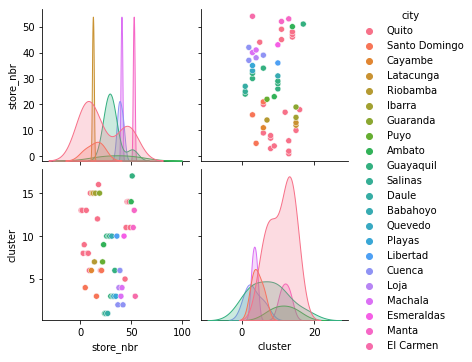

In [34]:
sns.pairplot(stores_data, hue="city");

- from the visualisation above, it was noticed that quito had more stores clustered in the city.

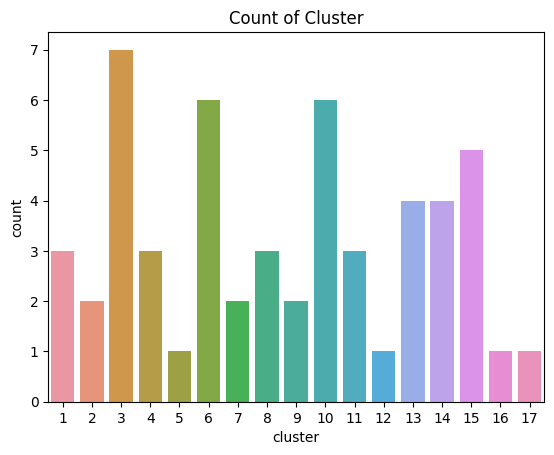

In [35]:
sns.countplot( x="cluster",data = stores_data)
plt.title("Count of Cluster")
plt.show();

- cluster 3 has the highest count as shown above.

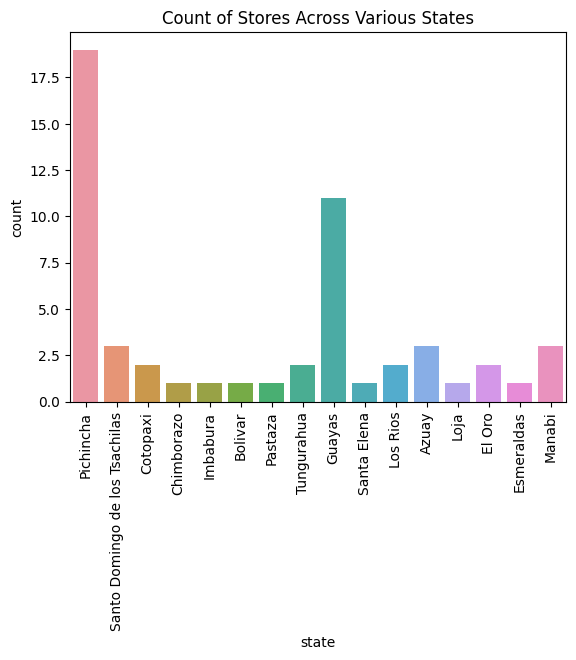

<Figure size 1500x1500 with 0 Axes>

In [36]:
sns.countplot(x="state",data=stores_data)

plt.title("Count of Stores Across Various States")
plt.xticks(rotation=90)
plt.figure(figsize= (15,15))

plt.show();


- There are 16 unique states with Pichincha having the highest number of stores

- There are 22 unique cities with Quito having the highest count

In [37]:
len(stores_data.store_nbr.unique())
##There are 54 unique stores

54

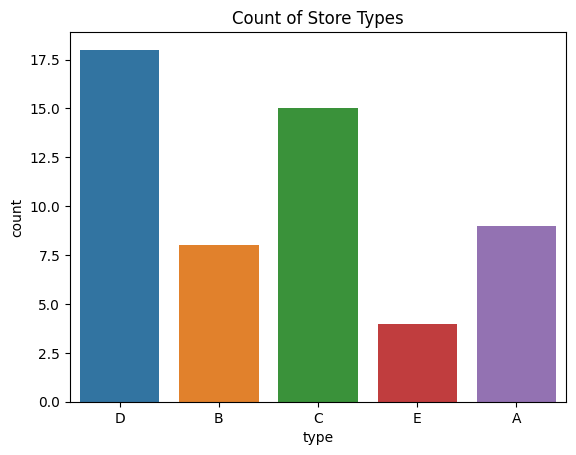

In [38]:
sns.countplot(x="type", data=stores_data)
plt.title("Count of Store Types")
plt.show();

- 5 unique store types with store D having the highest count

In [39]:
# Compute descriptive statistics for state
pd.DataFrame(stores_data['state'].describe().transpose())

,state
count,54
unique,16
top,Pichincha
freq,19


In [40]:
# Analyze the shape of the distribution of state
print(stores_data.skew())

store_nbr    0.000000
cluster      0.041241
dtype: float64


- this informs on how the dataset is positively skewed

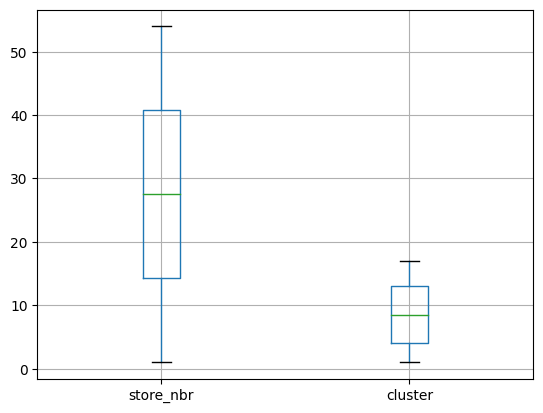

In [41]:
# Check for outliers
stores_data.boxplot();

- there are no outliers in the store_data dataset

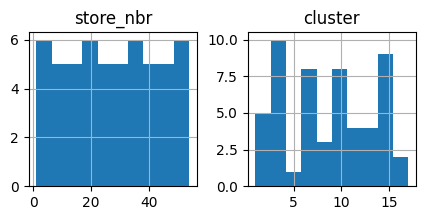

In [42]:
stores_data.hist(figsize=(5,2));

In [43]:
# Compute descriptive statistics for stores_data
print(stores_data.describe())

       store_nbr    cluster
count  54.000000  54.000000
mean   27.500000   8.481481
std    15.732133   4.693395
min     1.000000   1.000000
25%    14.250000   4.000000
50%    27.500000   8.500000
75%    40.750000  13.000000
max    54.000000  17.000000


- the visualisation shows a slightly positive trend between how stores numbers are being clustered

In [44]:
# Compute descriptive statistics for city
pd.DataFrame(stores_data['city'].describe())

,city
count,54
unique,22
top,Quito
freq,18


In [45]:
# Analyze the shape of the distribution for stores_data
stores_data.skew()

store_nbr    0.000000
cluster      0.041241
dtype: float64

#### NOTES;
0.0412413665900577 indicates that the 'cluster' column has a slightly positive skew, which means that the tail of 
the distribution is slightly longer on the right side. However, since the value is close to zero,it suggests that 
the distribution is almost symmetrical.

- type D is having the highest cluster

In Summary:

- There are 17 unique clusters with cluster 3 having the highest count
- There are 16 unique states
- There are 22 unique cities with Quito having the highest count
- There are 54 unique stores Across 16 states and 22 cities
- There are 5 unique store types with stores type D having the highest count

# transactions_data overview

In [46]:
transactions_data.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [47]:
transactions_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 1.9 MB


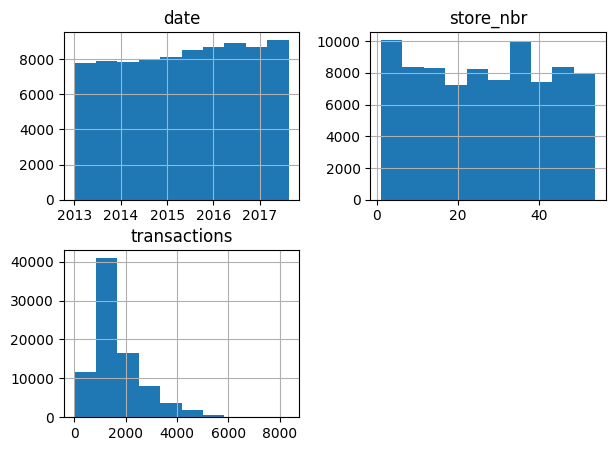

In [48]:
# Distribution of the transaction dataset
transactions_data.hist(figsize=(7,5));

In [49]:
# checking for skewness
transactions_data.skew()

store_nbr       0.003456
transactions    1.518351
dtype: float64

- the transaction dataset is positively skewwed to the right

In [50]:
## making a copy 
trans= transactions_data.copy()

In [51]:
# setting the date as index
transactions= transactions_data.set_index("date")
transactions.head()

,store_nbr,transactions
date,,
2013-01-01,25,770
2013-01-02,1,2111
2013-01-02,2,2358
2013-01-02,3,3487
2013-01-02,4,1922


In [52]:
# checking for trends and patterns
fig= ex.line(x= transactions.index, y= "transactions", data_frame= transactions)
fig.update_xaxes(rangeslider_visible=True)
fig.show()

- there is a positive trend in transactions through the years.

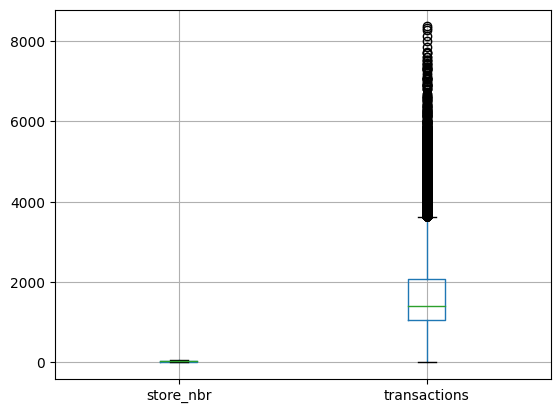

In [53]:
##Let's check for outliers
transactions.boxplot();

-there are outliers on the transactions attribute

In [54]:
# Compute descriptive statistics for transactions_data
pd.DataFrame(transactions_data.describe().transpose())

,count,mean,std,min,25%,50%,75%,max
store_nbr,83488.0,26.939237,15.608204,1.0,13.0,27.0,40.0,54.0
transactions,83488.0,1694.602158,963.286644,5.0,1046.0,1393.0,2079.0,8359.0


- in Summary;
- the transactions dataset has a minimum of 5 transactions and a maximum of 8359 transactions
- transactions attribute trends positively over time

# Exploring the Holidays Dataset

In [55]:
holidays_events_data.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [56]:
holidays=holidays_events_data.copy()
type_counts = holidays.groupby('type').size().reset_index(name='count')
type_counts

,type,count
0,Additional,51
1,Bridge,5
2,Event,56
3,Holiday,221
4,Transfer,12
5,Work Day,5


In [57]:
fig = ex.scatter(type_counts, x='type', y='count', size='count', color= "type", hover_name='type',log_y=False, size_max=60)

fig.show()

- from the visual , holiday is having the highest size of 221 counts and work day and bridge with smallest sizes of 5 counts respectively

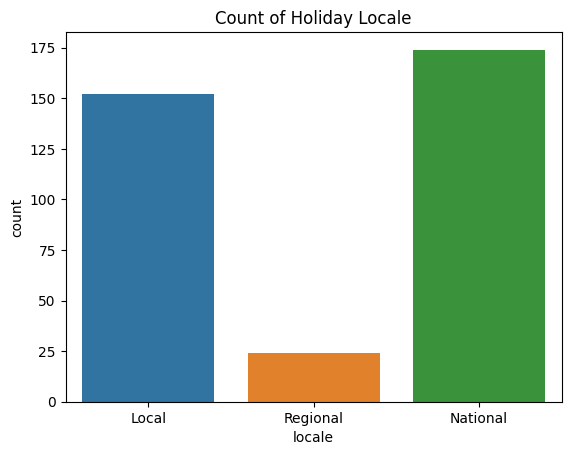

In [58]:
##Let's see which locale has the highest number of holidays
plt.title("Count of Holiday Locale")
sns.countplot(x="locale", data= holidays)
plt.show()

- from the countplot, National and Regional locale have the highest count and lowest count respectively 

In [59]:
# holidays that were transferred
trans_count= holidays.groupby("transferred").size().reset_index(name='count')
trans_count

,transferred,count
0,False,338
1,True,12


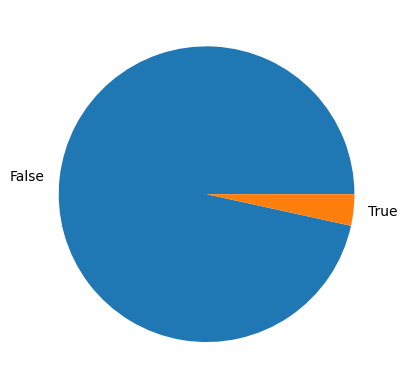

In [60]:
sns.set_color_codes("pastel")
plt.pie(data= trans_count,x= "count", labels= "transferred" );

- only 12 holidays were transferred

In [61]:
#We will like to see if the day of the earthquake was a holiday
holidays= holidays.set_index("date")
holidays

,type,locale,locale_name,description,transferred
date,,,,,
2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...
2017-12-22,Additional,National,Ecuador,Navidad-3,False
2017-12-23,Additional,National,Ecuador,Navidad-2,False
2017-12-24,Additional,National,Ecuador,Navidad-1,False


In [62]:
# Compute descriptive statistics for transactions_data
pd.DataFrame(holidays.describe())

,type,locale,locale_name,description,transferred
count,350,350,350,350,350
unique,6,3,24,103,2
top,Holiday,National,Ecuador,Carnaval,False
freq,221,174,174,10,338


Summary of the Holiday Column:
- Most holidays were national holidays
- Most holidays were observed the same day they occured
- Most of the holidays were not transferred except 12 holidays

# Exploring the Oil Dataset

In [63]:
oil_data.head()

,date,dcoilwtico
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [64]:
oil=oil_data.set_index('date')
oil.head()

,dcoilwtico
date,
2013-01-01,93.14
2013-01-02,93.14
2013-01-03,92.97
2013-01-04,93.12
2013-01-07,93.20


In [65]:
oil_data.copy()

,date,dcoilwtico
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


<AxesSubplot:>

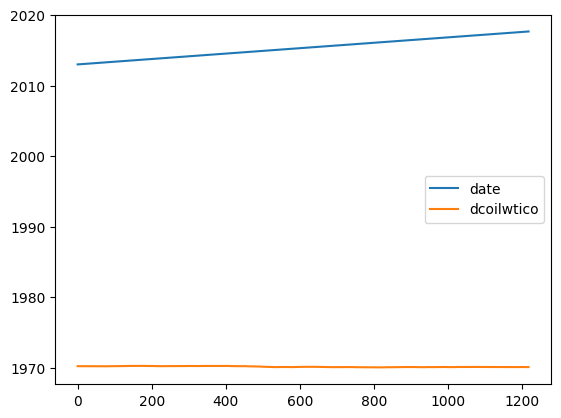

In [66]:
# visualizing the oil dataset
oil_data.plot()

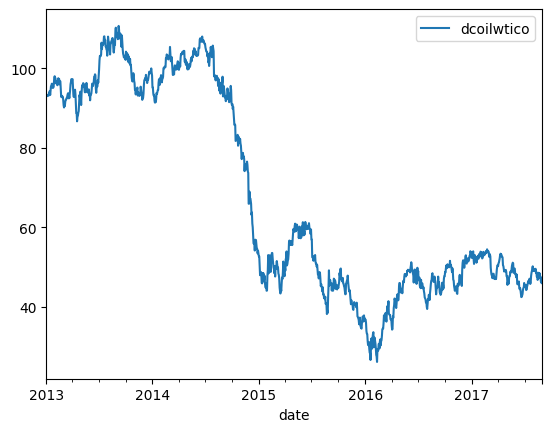

In [67]:
# checking for trends and pattern
oil.plot();

- from the above, there is a backward or downward trend over time

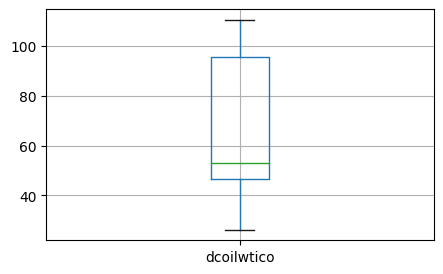

In [68]:
oil.boxplot(figsize=(5,3));

- there are no outliers 

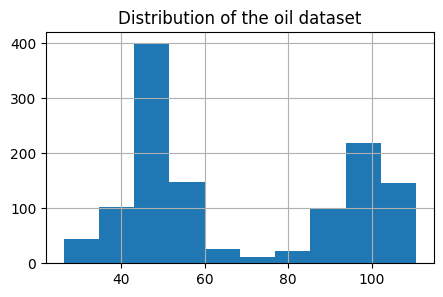

In [69]:
oil.hist(figsize=(5,3))
plt.title('Distribution of the oil dataset');

In [70]:
# Compute descriptive statistics for oil dataset
pd.DataFrame(oil.describe())

,dcoilwtico
count,1218.000000
mean,67.673325
std,25.637345
min,26.190000
25%,46.422500
50%,53.185000
75%,95.595000
max,110.620000


- in Summary,the oil prices trends negatively over time.

# Exploring the train dataset

In [71]:
# creating a copy
train_1= train_data.copy()

In [72]:
train_1.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [73]:
train=train_1.set_index('date')
train.head()

,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0
2013-01-01,1,1,BABY CARE,0.0,0
2013-01-01,2,1,BEAUTY,0.0,0
2013-01-01,3,1,BEVERAGES,0.0,0
2013-01-01,4,1,BOOKS,0.0,0


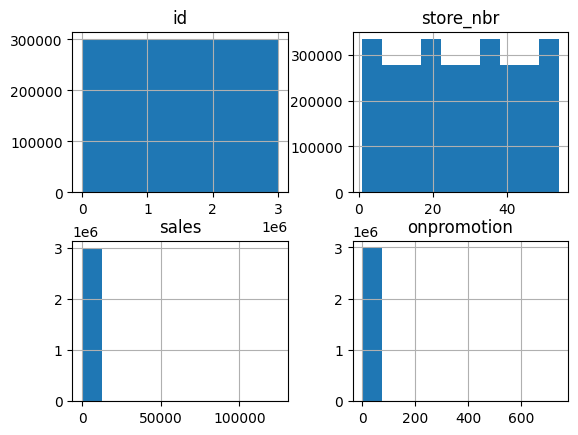

In [74]:
# checking the distribution for the train data
train.hist();

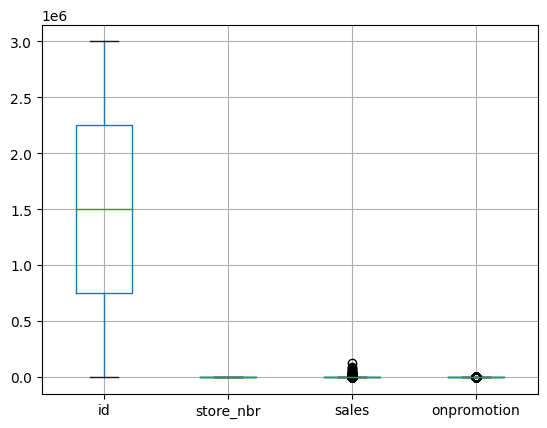

In [75]:
#Checking for outliers
train.boxplot();

- There are some outliers in the sales and promotions attributes

In [76]:
# checking for skewness
train.skew()

id            -9.492127e-16
store_nbr      0.000000e+00
sales          7.358758e+00
onpromotion    1.116656e+01
dtype: float64

In [77]:
# Compute descriptive statistics for train dataset
pd.DataFrame(train.describe())

,id,store_nbr,sales,onpromotion
count,3.000888e+06,3.000888e+06,3.000888e+06,3.000888e+06
mean,1.500444e+06,2.750000e+01,3.577757e+02,2.602770e+00
std,8.662819e+05,1.558579e+01,1.101998e+03,1.221888e+01
min,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,7.502218e+05,1.400000e+01,0.000000e+00,0.000000e+00
50%,1.500444e+06,2.750000e+01,1.100000e+01,0.000000e+00
75%,2.250665e+06,4.100000e+01,1.958473e+02,0.000000e+00
max,3.000887e+06,5.400000e+01,1.247170e+05,7.410000e+02


In [78]:
#Exploring the family attribute

family_counts = train.groupby('family').size().reset_index(name='count')
fig_1 = ex.scatter(family_counts, x='family', y='count', size='count', color= "family", hover_name='family',
                log_y=False, size_max=60)

fig_1.show()

-All the family had the same count, and this makes sense because on days there were no purchases, the family of the product was still include

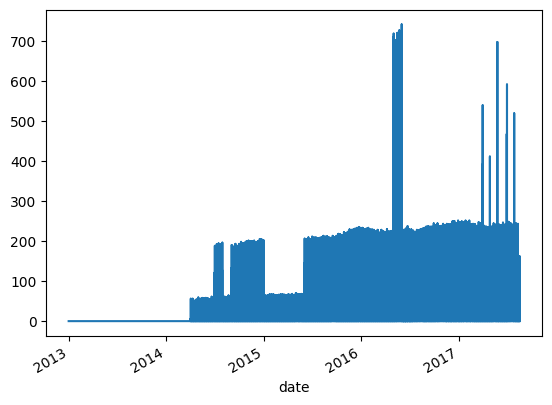

In [79]:
#Exploring the train atttribute
train["onpromotion"].plot();

- No promotions were made from 2013 to 2014
- There were increased promotions in 2016;likewise, 2017, and we will investigate that
- There was a drop in promotion within some months in 2015 and 2014

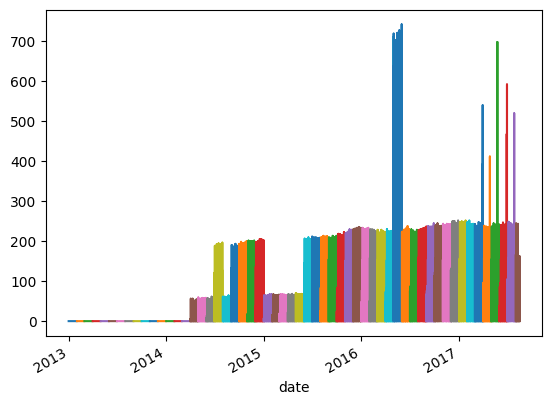

In [80]:
month_promo=train["onpromotion"].resample("M")
month_promo.plot();

Notes of promotion after resmapling on promotion by month:

- Promotions were toned down from January to May of 2015

- They increased thier promotions for May of 2016, and we are guessing this is because of the earthquake

- Also, we can see an increase in promotions for some days in march to july of 2017

### Bivariate &  Multivariate Analysis

Multivariate analysis’ is the analysis of more than one variable and aims to study the relationships among them. This analysis might be done by computing some statistical indicators like the correlation and by plotting some charts.

Please, read this article to know more about the charts.

### Let's see how transactions were affected by the earthquake

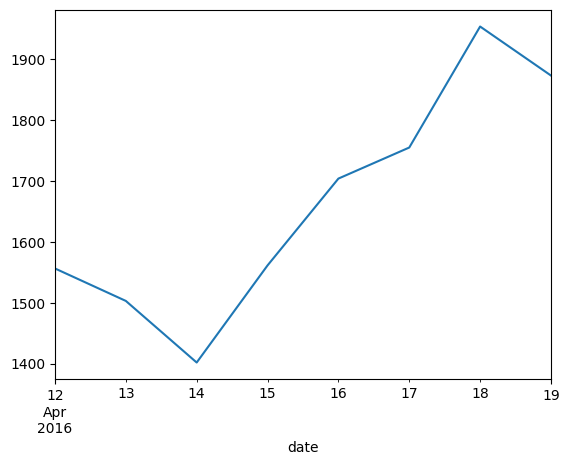

In [81]:
daily_trans= transactions["transactions"].resample("D").mean()
daily_trans.loc['2016-04-12' :'2016-04-19'].plot();

- the visualisations shows that after the earthquake on 16th April,2016, there was a sharp increase in the transactions within that particular week

In [82]:
# top five transactions from 12-April to 19-April 2016
earthquake=daily_trans.loc['2016-04-12' :'2016-04-19'].sort_values(ascending=False).head()
pd.DataFrame(earthquake)

,transactions
date,
2016-04-18,1953.943396
2016-04-19,1873.377358
2016-04-17,1755.056604
2016-04-16,1704.018868
2016-04-15,1561.339623


Summary after earthquake:
- massive rise in transactions after earthquake for  week, then falls again

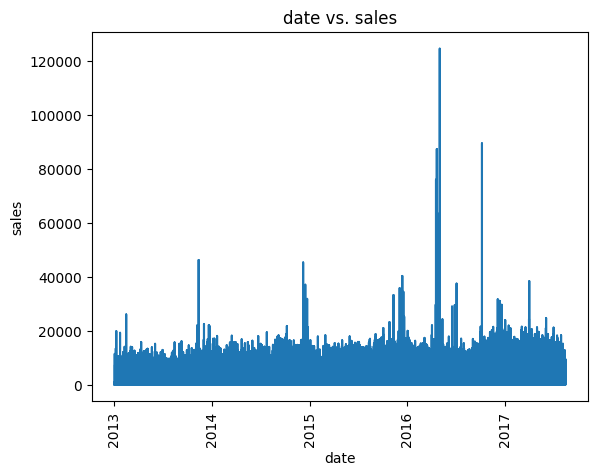

In [83]:
plt.plot(train_data['date'], train_data['sales'])
plt.xlabel('date')
plt.ylabel('sales')
plt.title('date vs. sales')
plt.xticks(rotation=90);
plt.show();

- the visual shows that maximum sales occurred within the first quarter 2016

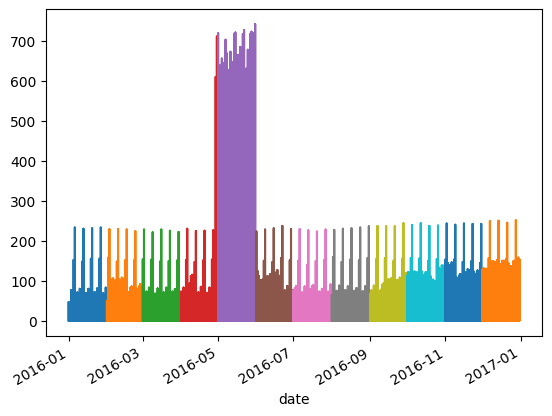

In [84]:
##Due to earthquake, might be interesting to see how promotions were affected in 2016
Month_2016=train["onpromotion"].loc["2016"].resample("M")
Month_2016.plot();

From the graph;
- onpromotions in 2016 were pretty steady in April
- They increased promotion during the end of April and in May of 2016

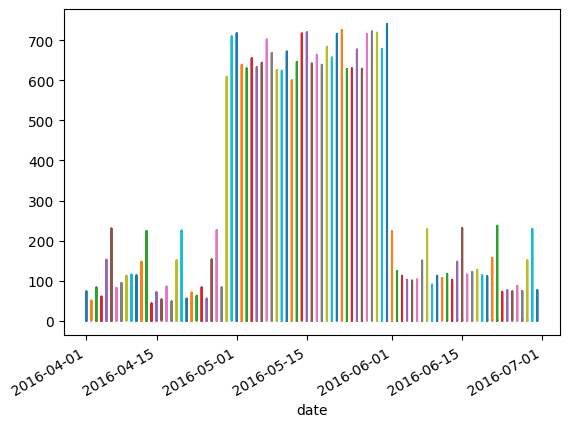

In [85]:
##Let's resample the above data by day to see which days  happened:
train_day=train["onpromotion"].loc["2016-04":"2016-06"].resample("D")
train_day.plot();

- Massive promotion was ran from 29th April to 31st May of 2016

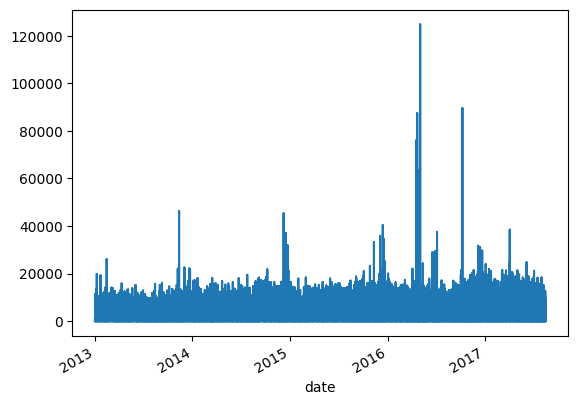

In [86]:
train.sales.plot();

Summary about on promotions:
- We can see some spikes in sales in 2014, 2015, 2016 (really prominent ones), and 2017 as well

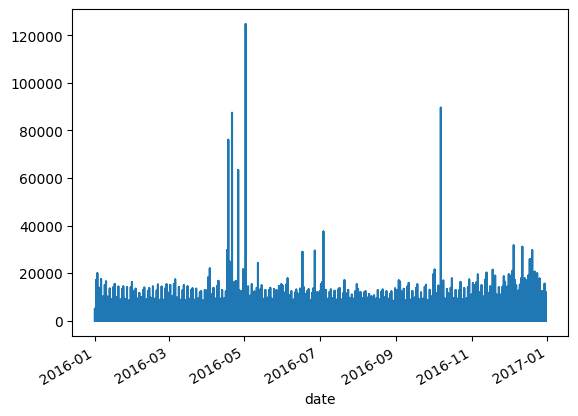

In [87]:
# visual showing the sales in the year 2016
train["sales"].loc["2016"].plot();

- the diagram depicts that maximum sales was recorded at the fisrt quarter of 2016, precisely from the second week of April to the beginning of the month of May.

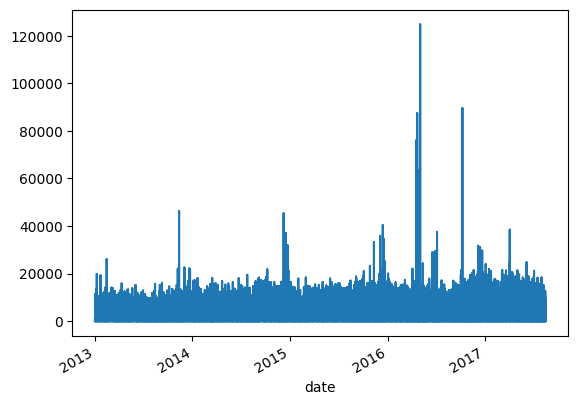

In [88]:
#Exploring the sales dataset
train["sales"].plot();

- We can see some sharp increase in sales so, we will investigate that

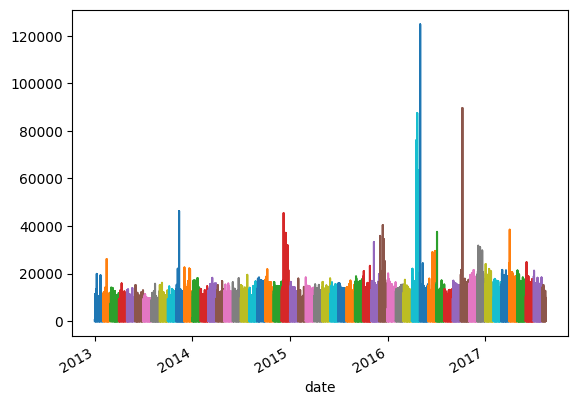

In [89]:
sale_month=train["sales"].resample("M")
sale_month.plot();

- Again, highest transactions for month was April, as showed by the diagram

In [90]:
sale_daily_Apr=train["onpromotion"].loc["2016-04-10":"2016-04-20"].resample("D")

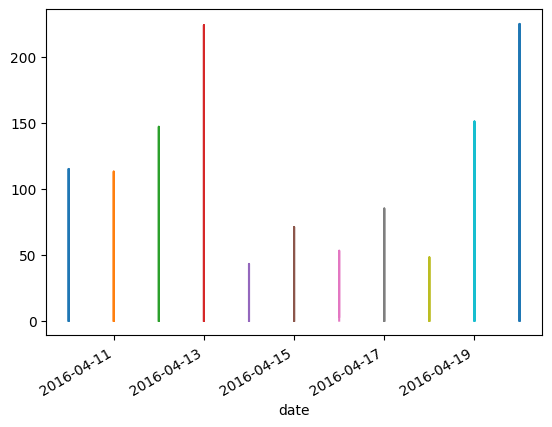

In [91]:
# visualisation of daily sales in the month of April
sale_daily_Apr.plot();

 - similarly, two days recorded the highest promotion, thus; 2016-04-13 and 2016-04-19

In [92]:
sales_sum=train.groupby("date").agg({"sales": "sum"})
sales_sum

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


checking for correlation in the train dataset

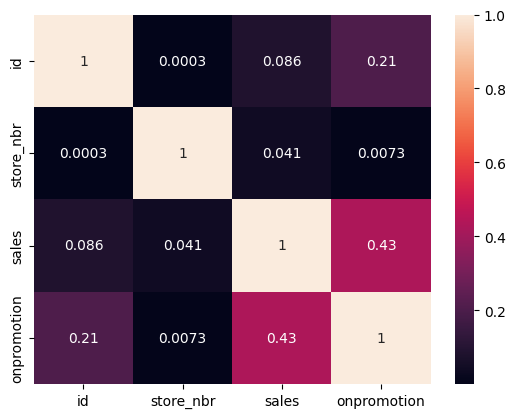

In [93]:
sns.heatmap(train.corr(), annot= True);

Answering Questions

Q1.which city had the highest stores

Q2.which month did we have the highest sale

Q3.which store had the highest transaction?

Q4.which store had the highest sale?

Q5what is the most bought product?

# Q1.which city had the highest stores

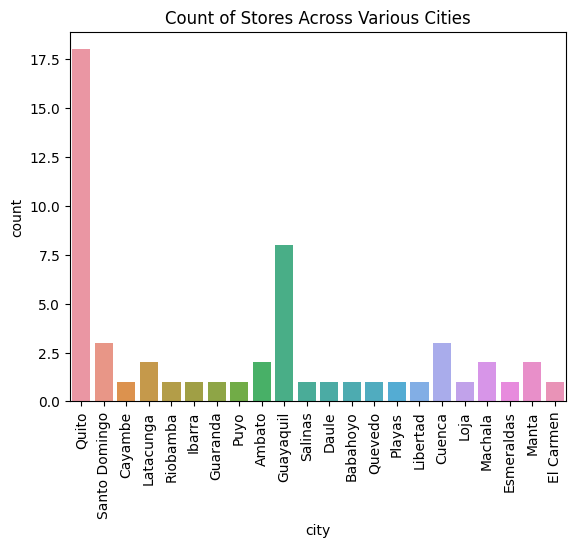

<Figure size 2000x1500 with 0 Axes>

In [94]:
sns.countplot(x="city", data=stores_data)
plt.title("Count of Stores Across Various Cities")
plt.xticks(rotation=90)
plt.figure(figsize= (20,15))

plt.show();

- from the visual, Quito recorded the highest, followed by Guayaqui

### Q2.which month did we have the highest sales

In [95]:
train_copy= train_data
train_copy.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [96]:
train_copy["month"]= train_copy["date"].dt.month
sales_by_month= train_copy.groupby("month").agg({"sales":"sum"}).sort_values(by="sales")

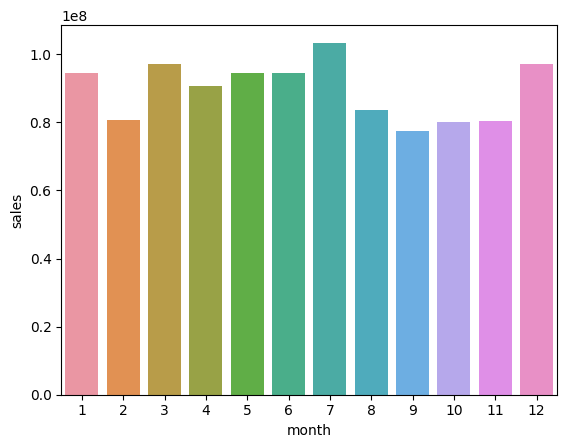

In [97]:
sns.barplot(data=sales_by_month, x= sales_by_month.index, y= "sales" );

- The highest sale (per unit product sold) was recorded in july 

### Q3.which store had the highest transaction?

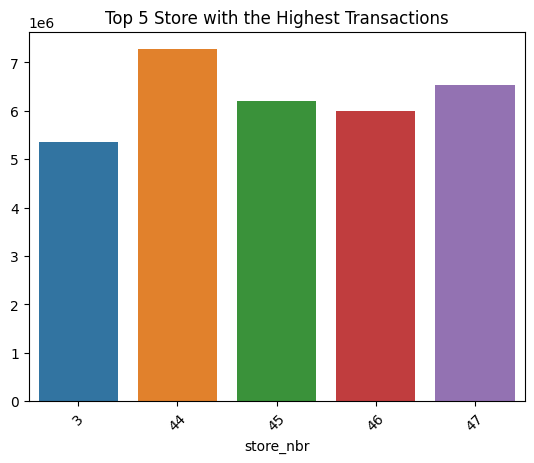

In [98]:
sto_tran= transactions.groupby("store_nbr")["transactions"].agg("sum").sort_values(ascending= False).head()
sns.barplot(x=sto_tran.index, y=sto_tran.values)
plt.xticks(rotation= 45)
plt.title('Top 5 Store with the Highest Transactions');

- store number 44 had the highest transactions

### Q4.which store had the highest sale?

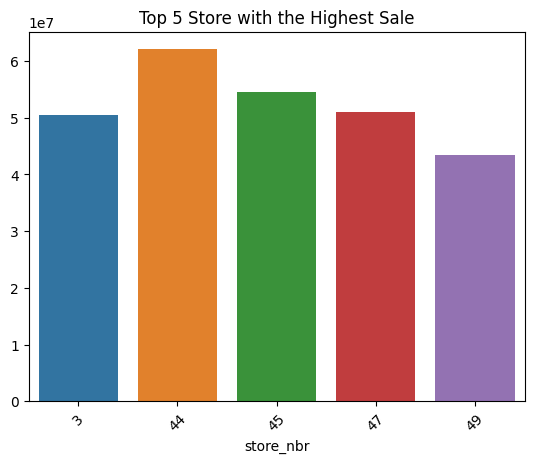

In [99]:
sto_sale= train.groupby("store_nbr")["sales"].agg("sum").sort_values(ascending= False).head()
sns.barplot(x=sto_sale.index, y=sto_sale.values)
plt.xticks(rotation= 45)
plt.title('Top 5 Store with the Highest Sale');

- obviously from the visualisation, store number 44 again has the highest sales

### Q5.what is the most bought product per unit sale?

In [100]:
family_bought=train[train['sales']!=0]

In [101]:
##Lets group and plot
family_sale = family_bought.groupby('family').size().reset_index(name='count').sort_values(by='count')
fig_2= ex.scatter(family_sale, x='family', y='count', size='count', color= "family", hover_name='family',
                log_y=False, size_max=60)
fig_2.show()

In [102]:
family_sale

,family,count
4,BOOKS,2769
1,BABY CARE,5337
31,SCHOOL AND OFFICE SUPPLIES,23568
17,HOME APPLIANCES,24082
19,LADIESWEAR,36514
23,MAGAZINES,39522
26,PET SUPPLIES,41271
14,HARDWARE,47412
20,LAWN AND GARDEN,48392
27,PLAYERS AND ELECTRONICS,50118


- books where bought less often but bread and bakery had the highest sales

## Univariate Modelling

The goal of this type of modelling is to forecast the general sales for Favorita irrespective of the product type, store number and other exogenous effects. Therefore, we will be using only time and the previous sales values to forecast the sales.

In [103]:
train_sales= train_copy.groupby("date").agg({"sales": "sum"})
train_sales.head()

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229


In [104]:
##Let's plot to check for any seasonality 
fig_3= ex.line(train_sales, x= train_sales.index, y= "sales", title= "Aggregated Sales With Slider")

fig_3.update_xaxes(rangeslider_visible= True, 
                 rangeselector= dict(buttons= list([dict(count= 1, label= "1y", step= "year", stepmode= "backward"), 
                                                    dict(count= 2, label= "2y", step= "year", stepmode= "backward"), 
                                                     dict(count= 3, label= "3y", step= "year", stepmode= "backward"),
                                                     dict(step="all")])))
fig_3.show()

Notes From The Plot:
-It is hard to detect any changes (trends and seasonality) due to the numerous data points.
-Also, we can see some sharp drops at the beginning of each year.
-To help us see the form of the data more clearly, we will resample it to a weekly frequency

In [105]:
weekly_sales= train_sales.resample("W").median()
weekly_sales.head()

,sales
date,
2013-01-06,419405.676176
2013-01-13,318347.777981
2013-01-20,299129.549954
2013-01-27,296214.728983
2013-02-03,285460.169953


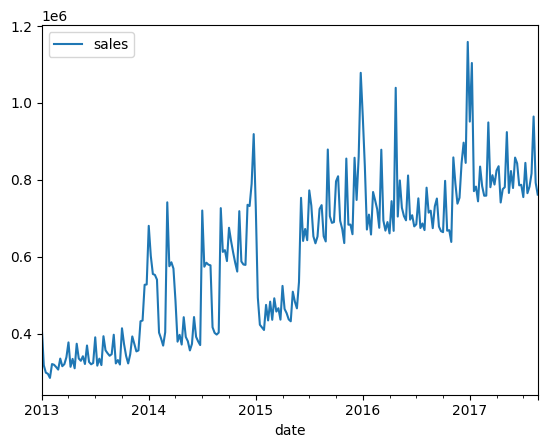

In [106]:
weekly_sales.plot();

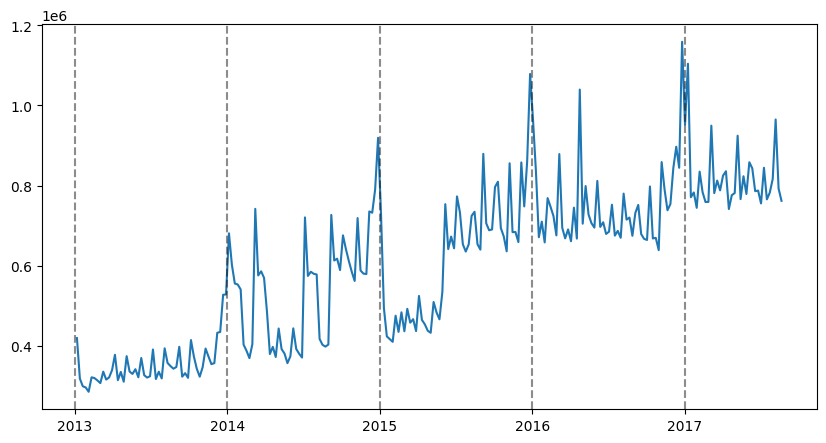

In [107]:
plt.figure(figsize= (10,5))
plt.plot(weekly_sales)

for year in range(2013, 2018):
    plt.axvline(datetime(year, 1, 1), color= "k", linestyle= "--", alpha= 0.5)

## Univariate Statistical Modelling

In [108]:
from statsmodels.tsa.stattools import adfuller as adf

In [109]:
result= adf(weekly_sales)
pd.DataFrame(result)

,0
0,-1.519161
1,0.524012
2,13
3,228
4,"{'1%': -3.4593607492757554, '5%': -2.874301580..."
5,5773.271607


- Our P-value is >0.05 so our data is non-statioary with a 95% confidence level

In [110]:
print("P_value: ", {result[1]})
if result[1] > 0.05:
    
    print("Data is Not Stationary")
else:
    print("Data is  stationary")

P_value:  {0.524012045549672}
Data is Not Stationary


- Since our time series is non-stationary, we will go ahead to decompose it to see its components. We will also use PACF and ACF to see the autocorrelation in the time series. These will help us make a more informed decisions

In [111]:
##performing decomposition
import statsmodels.api  as sm
res_add=  sm.tsa.seasonal_decompose(weekly_sales, model="multiplicative")

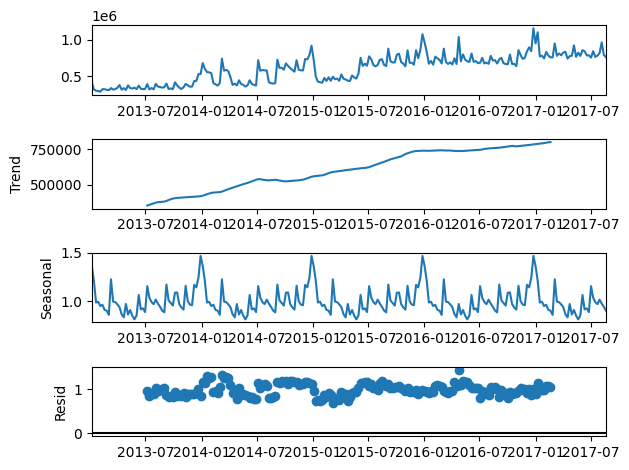

In [112]:
res_add.plot();

Note:
-Our data has a seasonal component, a trend component and a residual component.
-Now we will perform an ACF and a PACF test to solidify our decision on the type of model to use

In [113]:
##perfomring PACF and ACF test
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

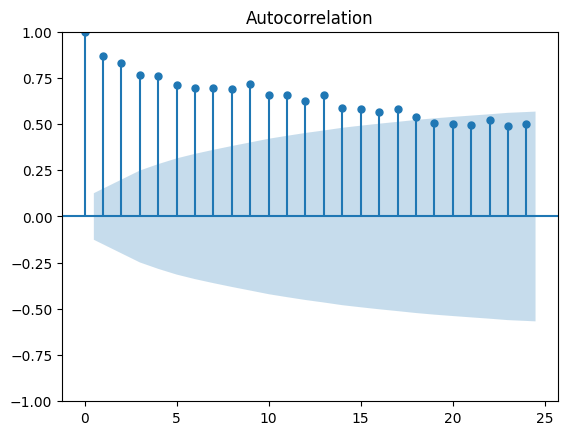

In [114]:
##ploting out ACF 
acf_plot= plot_acf(weekly_sales)

- We have tons of spikes above significant level and it isn't decaying, therefore, we will use a moving average model. We can also see some seasonality

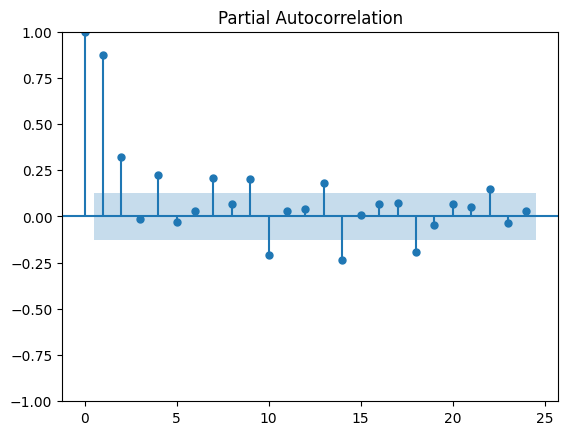

In [115]:
##plotting out pacf
pacf_plot= plot_pacf(weekly_sales)

- We can see strong Partila autocorrelation at or p values lag 1,2,4,6

# Data Splitting

In [116]:
from sklearn.model_selection import train_test_split
train_, test= train_test_split(weekly_sales, test_size= 0.2, shuffle= False)

In [117]:
train_.head()

,sales
date,
2013-01-06,419405.676176
2013-01-13,318347.777981
2013-01-20,299129.549954
2013-01-27,296214.728983
2013-02-03,285460.169953


## Univariate Model 1: Using AutoARIMA

In [118]:
#Importing our algorithm
from pmdarima import auto_arima
#Finding the best Arima model for the train_data
model_1= auto_arima(weekly_sales, m= 52, seasonal= True, start_p= 0, start_q= 0, max_p= 10, max_q= 15, max_d= 5, d= 1,
           
                   test= "adf", error_action= "ignore"
                   , suppress_warnings= True, stepwise= True, trace= True,  information_criterion='aic');

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[52] intercept   : AIC=6187.514, Time=3.07 sec
 ARIMA(0,1,0)(0,0,0)[52] intercept   : AIC=6229.846, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[52] intercept   : AIC=6151.752, Time=1.85 sec
 ARIMA(0,1,1)(0,0,1)[52] intercept   : AIC=6153.624, Time=1.86 sec
 ARIMA(0,1,0)(0,0,0)[52]             : AIC=6227.898, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[52] intercept   : AIC=6194.158, Time=0.06 sec
 ARIMA(1,1,0)(2,0,0)[52] intercept   : AIC=6153.741, Time=12.14 sec
 ARIMA(1,1,0)(1,0,1)[52] intercept   : AIC=6153.746, Time=3.89 sec
 ARIMA(1,1,0)(0,0,1)[52] intercept   : AIC=6156.757, Time=1.84 sec
 ARIMA(1,1,0)(2,0,1)[52] intercept   : AIC=6155.683, Time=42.87 sec
 ARIMA(0,1,0)(1,0,0)[52] intercept   : AIC=6185.626, Time=1.51 sec
 ARIMA(2,1,0)(1,0,0)[52] intercept   : AIC=6153.507, Time=2.41 sec
 ARIMA(1,1,1)(1,0,0)[52] intercept   : AIC=6149.522, Time=5.23 sec
 ARIMA(1,1,1)(0,0,0)[52] intercept   : AIC=6183.171, Time=0.14 sec
 ARIMA(1,1,1)(2,0

In [119]:
model_1.fit(train_)

ARIMA(order=(2, 1, 1), scoring_args={}, seasonal_order=(1, 0, 0, 52),
      suppress_warnings=True, with_intercept=False)

In [120]:
#Since the prediction returned a series, we will retrieve our time series index
result_1= model_1.predict(len(test))

In [121]:
result_1

2016-09-18    730228.006465
2016-09-25    735830.848838
2016-10-02    773458.995077
2016-10-09    778964.728557
2016-10-16    738472.866526
2016-10-23    731415.033041
2016-10-30    718592.140191
2016-11-06    796516.621630
2016-11-13    735834.791861
2016-11-20    736048.091040
2016-11-27    727262.891578
2016-12-04    797646.490446
2016-12-11    758851.041384
2016-12-18    798534.498939
2016-12-25    875839.291032
2017-01-01    835633.356217
2017-01-08    789873.881744
2017-01-15    731733.381828
2017-01-22    745457.167975
2017-01-29    727165.646545
2017-02-05    766277.318625
2017-02-12    758618.217190
2017-02-19    750428.241912
2017-02-26    733362.366947
2017-03-05    805169.232145
2017-03-12    740114.458414
2017-03-19    730750.172464
2017-03-26    738637.313942
2017-04-02    728227.692131
2017-04-09    757861.771271
2017-04-16    730545.764520
2017-04-23    862125.886832
2017-04-30    743709.886398
2017-05-07    776928.489926
2017-05-14    751759.892938
2017-05-21    744143

### visualizing and testing our error for SARIMA model

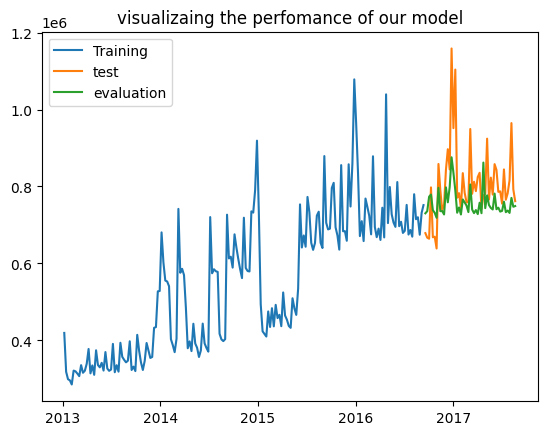

In [122]:
plt.plot(train_, label= "Training")
plt.plot(test, label= "test")
plt.plot(result_1, label= "evaluation")
plt.legend()
plt.title("visualizaing the perfomance of our model")
plt.show()

In [123]:
##Checking the performance of the non-transformed dataset
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_log_error as MSLE
from sklearn.metrics import mean_squared_error as MSE
from statsmodels.tools.eval_measures import rmse

MEA_error_1= (MAE(test, result_1).round(2)/test.mean())* 100
RMSLE_error_1= np.sqrt(MSLE(test, result_1))
error_1= pd.DataFrame([["SARIMA", MEA_error_1, RMSLE_error_1]], columns= ["Model", "MAE", "RMSLE"])
               
error_1

,Model,MAE,RMSLE
0,SARIMA,sales 8.766755 dtype: float64,0.109081


### Forecasting With SARIMA

In [124]:
# to forecast, we will fit our model to the whole dataset
model_1.fit(weekly_sales)

ARIMA(order=(2, 1, 1), scoring_args={}, seasonal_order=(1, 0, 0, 52),
      suppress_warnings=True, with_intercept=False)

In [125]:
# let our model forecast over the next 20 weeks
forecast_dates= pd.date_range(start="2017-08-20", end= "2017-12-20", freq= "W" )
pd.DataFrame(forecast_dates)

,0
0,2017-08-20
1,2017-08-27
2,2017-09-03
3,2017-09-10
4,2017-09-17
5,2017-09-24
6,2017-10-01
7,2017-10-08
8,2017-10-15
9,2017-10-22


In [126]:
forecast_1= model_1.predict(n_periods= len(weekly_sales)+10 )
pd.DataFrame(forecast_1.tail())

,0
2022-05-22,852782.328847
2022-05-29,853617.592932
2022-06-05,853458.385775
2022-06-12,852855.704843
2022-06-19,852870.914708


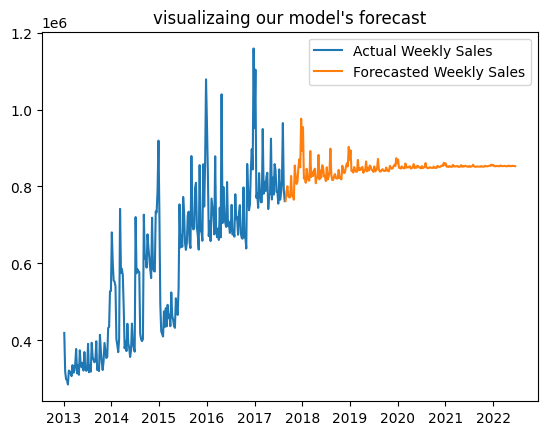

In [127]:
plt.plot(weekly_sales, label= "Actual Weekly Sales")
plt.plot(forecast_1, label= "Forecasted Weekly Sales")
plt.legend()
plt.title("visualizaing our model's forecast")
plt.show()

-Final Notes:
- Our model did very well
- I could have used log transformation to increase the performance
- We will also need to consider other time series to improve the performance (we will do this in the multivariate analysis)

### Univariate Modeling Using Facebook Prophet

In [128]:
# importing the algorithm 
from prophet import Prophet

In [129]:
fbp_sales= train_sales.reset_index()[["date", "sales"]].rename({"date": "ds", "sales": "y"}, axis= "columns")

In [130]:
train_fbp, test_fbp= train_test_split(fbp_sales, test_size= 0.2, shuffle= False)

In [131]:
train_fbp.head()

,ds,y
0,2013-01-01,2511.618999
1,2013-01-02,496092.417944
2,2013-01-03,361461.231124
3,2013-01-04,354459.677093
4,2013-01-05,477350.121229


In [132]:
test_fbp.head()

,ds,y
1347,2016-09-12,678776.459126
1348,2016-09-13,603427.946974
1349,2016-09-14,624262.071976
1350,2016-09-15,568324.812986
1351,2016-09-16,691912.601466


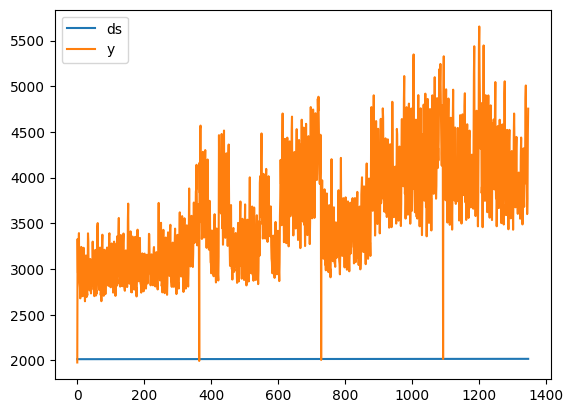

In [133]:
train_fbp.plot();

In [134]:
model_2= Prophet(yearly_seasonality= True, interval_width= 0.95)
model_2.fit(train_fbp)

08:02:17 - cmdstanpy - INFO - Chain [1] start processing
08:02:22 - cmdstanpy - INFO - Chain [1] done processing


In [135]:
#We will extract the date and let it predict over, that so we can estimate our model's performance
test_date= pd.DataFrame(test_fbp["ds"])
test_date.head()

,ds
1347,2016-09-12
1348,2016-09-13
1349,2016-09-14
1350,2016-09-15
1351,2016-09-16


### Evaluating our mode

In [136]:
eval_2= model_2.predict(test_date)
eval_2.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-09-12,807456.185152,616967.989099,1.034501e+06,807456.185152,807456.185152,14792.476527,14792.476527,14792.476527,-17568.091153,-17568.091153,-17568.091153,32360.567680,32360.567680,32360.567680,0.0,0.0,0.0,822248.661679
1,2016-09-13,807572.250570,575875.804717,9.796908e+05,807572.250570,807572.250570,-28708.003731,-28708.003731,-28708.003731,-62142.472164,-62142.472164,-62142.472164,33434.468433,33434.468433,33434.468433,0.0,0.0,0.0,778864.246838
2,2016-09-14,807688.315987,576008.051123,1.002173e+06,807688.315987,807701.295476,-9143.615644,-9143.615644,-9143.615644,-43512.179300,-43512.179300,-43512.179300,34368.563656,34368.563656,34368.563656,0.0,0.0,0.0,798544.700343
3,2016-09-15,807804.381405,526666.906917,9.231521e+05,807795.640239,807860.709688,-85665.331413,-85665.331413,-85665.331413,-120855.204479,-120855.204479,-120855.204479,35189.873066,35189.873066,35189.873066,0.0,0.0,0.0,722139.049993
4,2016-09-16,807920.446823,594910.579519,9.745941e+05,807888.655434,808016.316400,-24109.152580,-24109.152580,-24109.152580,-60031.929771,-60031.929771,-60031.929771,35922.777191,35922.777191,35922.777191,0.0,0.0,0.0,783811.294243


In [137]:
##getting the date and y_hat
result_2= eval_2[["ds", "yhat"]]
result_2.head()

,ds,yhat
0,2016-09-12,822248.661679
1,2016-09-13,778864.246838
2,2016-09-14,798544.700343
3,2016-09-15,722139.049993
4,2016-09-16,783811.294243


In [138]:
train_fbp= train_fbp.set_index("ds")

In [139]:
test_fbp=  test_fbp.set_index("ds")

In [140]:
result_2= result_2.set_index("ds")

### visualizing our model's performance

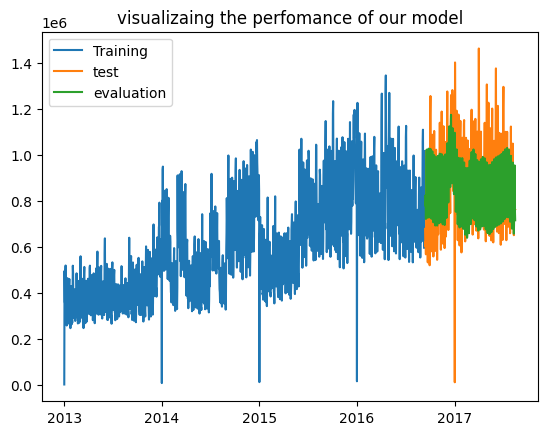

In [141]:
plt.plot(train_fbp, label= "Training")
plt.plot(test_fbp, label= "test")
plt.plot(result_2, label= "evaluation")
plt.legend()
plt.title("visualizaing the perfomance of our model");

### Evaluating our mode

In [142]:
MEA_error_2= (MAE(test_fbp, result_2).round(2)/test.mean())* 100
RMSLE_error_2= np.sqrt(MSLE(test_fbp, result_2))
error_2= pd.DataFrame([["Facebook Prophet", MEA_error_2, RMSLE_error_2]], columns= ["Model", "MAE", "RMSLE"])
              
error_2

,Model,MAE,RMSLE
0,Facebook Prophet,sales 11.017831 dtype: float64,0.277652


### Forecasting with FBP

In [143]:
##we will have the model learn the whole dataset
forecast_dates_2= pd.date_range(start="2017-08-16", end= "2018-01-20" )
forecast_dates_2= pd.DataFrame(forecast_dates_2)

In [144]:
forecast_dates_2.columns= ["ds"]
forecast_dates_2.head()

,ds
0,2017-08-16
1,2017-08-17
2,2017-08-18
3,2017-08-19
4,2017-08-20


In [145]:
forecast_2= model_2.predict(forecast_dates_2)

In [146]:
forecast_2.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-08-16,846686.296392,492706.392229,9.396373e+05,846686.296392,846686.296392,-109965.607948,-109965.607948,-109965.607948,-43512.179300,-43512.179300,-43512.179300,-66453.428648,-66453.428648,-66453.428648,0.0,0.0,0.0,736720.688444
1,2017-08-17,846802.361810,453185.825641,8.559823e+05,846802.361810,846802.361810,-185112.431400,-185112.431400,-185112.431400,-120855.204479,-120855.204479,-120855.204479,-64257.226921,-64257.226921,-64257.226921,0.0,0.0,0.0,661689.930410
2,2017-08-18,846918.427228,531606.892047,9.218613e+05,846894.441516,846919.982397,-121549.338974,-121549.338974,-121549.338974,-60031.929771,-60031.929771,-60031.929771,-61517.409203,-61517.409203,-61517.409203,0.0,0.0,0.0,725369.088254
3,2017-08-19,847034.492645,709820.751762,1.113324e+06,846964.801631,847043.787727,67785.248808,67785.248808,67785.248808,126059.092114,126059.092114,126059.092114,-58273.843307,-58273.843307,-58273.843307,0.0,0.0,0.0,914819.741453
4,2017-08-20,847150.558063,761934.021421,1.168989e+06,847030.746525,847176.916645,123476.727196,123476.727196,123476.727196,178050.784753,178050.784753,178050.784753,-54574.057558,-54574.057558,-54574.057558,0.0,0.0,0.0,970627.285259


In [147]:
result_2= forecast_2[["ds", "yhat"]]

In [148]:
##Let's make the date the index
result_2.set_index("ds", inplace=True)
result_2.head()

,yhat
ds,
2017-08-16,736720.688444
2017-08-17,661689.930410
2017-08-18,725369.088254
2017-08-19,914819.741453
2017-08-20,970627.285259


In [149]:
fbp_sales.head()

,ds,y
0,2013-01-01,2511.618999
1,2013-01-02,496092.417944
2,2013-01-03,361461.231124
3,2013-01-04,354459.677093
4,2013-01-05,477350.121229


In [150]:
fbp_sales["ds"] = pd.to_datetime(fbp_sales["ds"])

In [151]:
fbp_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684 entries, 0 to 1683
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      1684 non-null   datetime64[ns]
 1   y       1684 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 26.4 KB


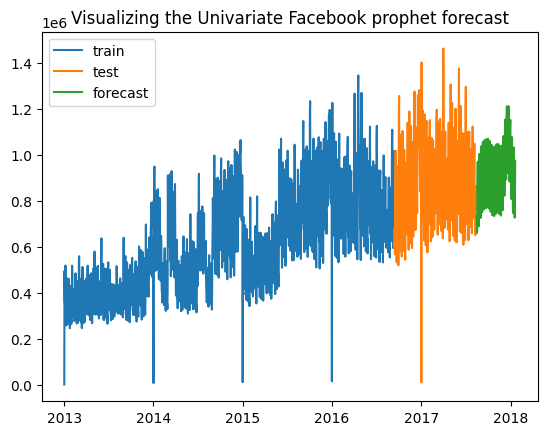

In [152]:
plt.plot(train_fbp, label= "train")
plt.plot(test_fbp, label= "test")
plt.plot(result_2, label= "forecast")
plt.title("Visualizing the Univariate Facebook prophet forecast")
plt.legend();

## Multivariate Forecasting
The idea here is to see how the other columns (exogenous variables) affect sales. We believe this will actually improve the accuracy of our models

Workflow:
-First, we will have an overview all the datasets again
-We will merge only the time series datasets since we are doing multivariate
-We will also do some prelimenary feature selection using granger's causality test
-Afterwards we will perform some feature engineering
-For models such as decision tree that has in-built feature selection we will leverage that as well
The models we will be using include:

-SARIMAX
-Facebook Prophet
-VAR
-Decision Tree
-XGBOOST

We will only be considering:

- transaction
- oil
- train
- holidays

Also, since we have our target(sales) in the transaction column, we are going to filter all other datasets (from 2013-01-01 to 2017-08-15) to match the date of our train dataset. Doing this will help us see how the other variables affect our sales within the same time period.

Also, we won't be considering the store dataset because we won't be forecasting the sales for each product across each store. We are trying to forecast the unit sales across all stores of favorita

In [153]:
transactions.head()

,store_nbr,transactions
date,,
2013-01-01,25,770
2013-01-02,1,2111
2013-01-02,2,2358
2013-01-02,3,3487
2013-01-02,4,1922


In [154]:
holidays_events_data.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [155]:
transac_train= transactions.loc['2013-01-01': '2017-08-15']
oil_train= oil.loc['2013-01-01': '2017-08-15']
holidays_train= holidays.loc['2013-01-01': '2017-08-15']

### Merging our datasets

In [156]:
merged_data1= pd.merge(train_data, transac_train, how= "outer", on= ["date", "store_nbr"])
merged_data2= pd.merge(merged_data1, holidays_train, how= "outer", on= "date")
merged_data3=  pd.merge(merged_data2, oil_train, how= "outer", on= "date")

In [157]:
merged_data3.head()

,id,date,store_nbr,family,sales,onpromotion,month,transactions,type,locale,locale_name,description,transferred,dcoilwtico
0,0.0,2013-01-01,1.0,AUTOMOTIVE,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,1.0,2013-01-01,1.0,BABY CARE,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,2.0,2013-01-01,1.0,BEAUTY,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,3.0,2013-01-01,1.0,BEVERAGES,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,4.0,2013-01-01,1.0,BOOKS,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14


In [158]:
#We will be dropping the store number and family column since we won't need them
merged_data= merged_data3.drop(["family", "store_nbr", "month","id"], axis= 1)
merged_data.head()

,date,sales,onpromotion,transactions,type,locale,locale_name,description,transferred,dcoilwtico
0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14


#### handling missing values

In [159]:
merged_data.isna().sum()

date                  0
sales                 4
onpromotion           4
transactions     249121
type            2551824
locale          2551824
locale_name     2551824
description     2551824
transferred     2551824
dcoilwtico       878527
dtype: int64

In [160]:
merged_data= merged_data.dropna(subset=["sales", "onpromotion"])

In [161]:
#For transactions, we will replace the na values with 0 since it means no transaction was recorded on the said date
merged_data["transactions"]= merged_data["transactions"].replace(np.nan, 0)
#We will be dropping the locale_name and description of holiday
merged_data= merged_data.drop(["locale_name", "description"], axis= 1)

In [162]:
merged_data.isna().sum()

date                  0
sales                 0
onpromotion           0
transactions          0
type            2551824
locale          2551824
transferred     2551824
dcoilwtico       878526
dtype: int64

In [163]:
merged_data["type"]=merged_data["type"].replace(np.nan, "Not Holiday")
merged_data["locale"]=merged_data["locale"].replace(np.nan, "Not Holiday")
merged_data["transferred"]=merged_data["transferred"].replace(np.nan, "False")

In [164]:
merged_data.isna().sum()

date                 0
sales                0
onpromotion          0
transactions         0
type                 0
locale               0
transferred          0
dcoilwtico      878526
dtype: int64

In [165]:
##let's rename the type column to holiday type
merged_data= merged_data.rename(columns= {"type": "holiday"})

## Feature Selection using Granger causality test
Granger causality test is a test which validates the fact that one time series has an effect on another time series. I think this will be a good metric since we want our model to be as accurate as possible.

Note the following:

- the null hypothesis is that y(the second variable) doesn't cause x. Therefore if the p-value is greater than 0.05 we accept the hypothesis, else we reject it.

- We will be performing the test over 20 lags to help us make an informed decision

Assumptions:
We are going to assume holidays have an effect on sales. Therefore, we will check the causality of only the numeric columns

In [166]:
from statsmodels.tsa.stattools import grangercausalitytests

In [167]:
merged= merged_data.groupby(["date", "holiday","locale", "transferred" ]).agg({"sales": "sum", "onpromotion": "sum","transactions": "sum","dcoilwtico": "mean" })

In [168]:
merged.head()

,,,,sales,onpromotion,transactions,dcoilwtico
date,holiday,locale,transferred,,,,
2013-01-01,Holiday,National,False,2511.618999,0.0,25410.0,93.14
2013-01-02,Not Holiday,Not Holiday,False,496092.417944,0.0,3076095.0,93.14
2013-01-03,Not Holiday,Not Holiday,False,361461.231124,0.0,2590632.0,92.97
2013-01-04,Not Holiday,Not Holiday,False,354459.677093,0.0,2590302.0,93.12
2013-01-05,Work Day,National,False,477350.121229,0.0,3087909.0,NaN


In [169]:
merged= merged.reset_index()
merged= merged.set_index("date")

In [170]:
##Let's perform our causality test
result_1= grangercausalitytests(merged[["sales", "onpromotion"]], maxlag= 20, verbose= False)
result_1


{1: ({'ssr_ftest': (103.20893433612034, 1.401289156871835e-23, 1699.0, 1),
   'ssr_chi2test': (103.39117495001578, 2.750973953612928e-24, 1),
   'lrtest': (100.37248099318822, 1.2627035668421978e-23, 1),
   'params_ftest': (103.20893433611953, 1.4012891568723926e-23, 1699.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (134.94330047900254, 4.126128268328458e-55, 1696.0, 2),
   'ssr_chi2test': (270.68225721082945, 1.6676106963700216e-59, 2),
   'lrtest': (251.18803523843235, 2.8524049925153823e-55, 2),
   'params_ftest': (134.9433004790025, 4.1261282683289274e-55, 1696.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (108.90722089684624, 1.7826498825082707e-64, 1693.0, 3),
   'ssr_chi2test': (328.0725496597258, 8.340532780870098e-71, 3),
   'lrtest': (299.97793363542587, 1.0058765068363655e-64, 3),
   'params_ftest': (108.90722089684618, 1.7826498825084734e-64, 1693.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 

In [171]:
for lag in result_1.keys():
    print(f"Lag {lag}:")
    print(f"F-statistic: {result_1[lag][0]['params_ftest'][0]}")
    print(f"Critical values: {result_1[lag][0]['params_ftest'][1:]}")
    print(f"P-value: {result_1[lag][0]['params_ftest'][1]}")
    print()

Lag 1:
F-statistic: 103.20893433611953
Critical values: (1.4012891568723926e-23, 1699.0, 1.0)
P-value: 1.4012891568723926e-23

Lag 2:
F-statistic: 134.9433004790025
Critical values: (4.1261282683289274e-55, 1696.0, 2.0)
P-value: 4.1261282683289274e-55

Lag 3:
F-statistic: 108.90722089684618
Critical values: (1.7826498825084734e-64, 1693.0, 3.0)
P-value: 1.7826498825084734e-64

Lag 4:
F-statistic: 90.67625579579155
Critical values: (6.688327853229188e-70, 1690.0, 4.0)
P-value: 6.688327853229188e-70

Lag 5:
F-statistic: 82.95320613349463
Critical values: (4.831425335835979e-78, 1687.0, 5.0)
P-value: 4.831425335835979e-78

Lag 6:
F-statistic: 71.38526658285274
Critical values: (2.0091374294353124e-79, 1684.0, 6.0)
P-value: 2.0091374294353124e-79

Lag 7:
F-statistic: 30.47854224272985
Critical values: (6.541547849303779e-40, 1681.0, 7.0)
P-value: 6.541547849303779e-40

Lag 8:
F-statistic: 29.168247542051816
Critical values: (6.671016390962562e-43, 1678.0, 8.0)
P-value: 6.671016390962562e-4

### Our Findings for the causality between sales and onpromotion:
- Over 20 lags, our p-value seem to be less than 0.05;therefore, we reject the null hypothesis.
In basic terms, on-promotion has a causal effect on sales;therefore, we keep it

In [172]:
result_2= grangercausalitytests(merged[["sales", "transactions"]], maxlag= 20, verbose= False)
result_2

{1: ({'ssr_ftest': (89.9043774822756, 8.090881425762394e-21, 1699.0, 1),
   'ssr_chi2test': (90.06312564734142, 2.3068122392988646e-21, 1),
   'lrtest': (87.76109426990297, 7.385749828878128e-21, 1),
   'params_ftest': (89.90437748226074, 8.090881425820114e-21, 1699.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (52.93618075236827, 5.002036553091621e-23, 1696.0, 2),
   'ssr_chi2test': (106.18448521200287, 8.756529282880228e-24, 2),
   'lrtest': (103.00199293615151, 4.2993363379975035e-23, 2),
   'params_ftest': (52.936180752365416, 5.002036553104629e-23, 1696.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (35.80843532795205, 1.9561196183773678e-22, 1693.0, 3),
   'ssr_chi2test': (107.86947440788862, 3.1535676869971835e-23, 3),
   'lrtest': (104.58538540357404, 1.604509280190379e-22, 3),
   'params_ftest': (35.80843532794194, 1.9561196184048878e-22, 1693.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0

In [173]:
for lag in result_2.keys():
    print(f"Lag {lag}:")
    print(f"F-statistic: {result_2[lag][0]['params_ftest'][0]}")
    print(f"Critical values: {result_2[lag][0]['params_ftest'][1:]}")
    print(f"P-value: {result_2[lag][0]['params_ftest'][1]}")
    print()

Lag 1:
F-statistic: 89.90437748226074
Critical values: (8.090881425820114e-21, 1699.0, 1.0)
P-value: 8.090881425820114e-21

Lag 2:
F-statistic: 52.936180752365416
Critical values: (5.002036553104629e-23, 1696.0, 2.0)
P-value: 5.002036553104629e-23

Lag 3:
F-statistic: 35.80843532794194
Critical values: (1.9561196184048878e-22, 1693.0, 3.0)
P-value: 1.9561196184048878e-22

Lag 4:
F-statistic: 23.68662369137428
Critical values: (4.400575857337172e-19, 1690.0, 4.0)
P-value: 4.400575857337172e-19

Lag 5:
F-statistic: 24.827271470771024
Critical values: (3.315860047506714e-24, 1687.0, 5.0)
P-value: 3.315860047506714e-24

Lag 6:
F-statistic: 20.938240031278024
Critical values: (8.659682862329463e-24, 1684.0, 6.0)
P-value: 8.659682862329463e-24

Lag 7:
F-statistic: 10.583191338581875
Critical values: (4.391775719394294e-13, 1681.0, 7.0)
P-value: 4.391775719394294e-13

Lag 8:
F-statistic: 28.621116566498877
Critical values: (4.3461679028484913e-42, 1678.0, 8.0)
P-value: 4.3461679028484913e-42


In [174]:
#Our final dataset
final_data= merged.drop("dcoilwtico", axis= 1)
#final_data.to_csv("Documents/final_dataset.csv")

# Feature Engineering

In [175]:
#encoding transferred
final_data[["transferred"]]

,transferred
date,
2013-01-01,False
2013-01-02,False
2013-01-03,False
2013-01-04,False
2013-01-05,False
...,...
2017-08-11,False
2017-08-12,False
2017-08-13,False


In [176]:
#First, we will replace the string "False" with the Boolean False and then replace false with 0 and true with 1
final_data["transferred"]=final_data["transferred"].replace("False", False)
##let's replace False with 0 and true with 1
final_data["transferred"]=final_data["transferred"].replace(False, 0)
final_data["transferred"]=final_data["transferred"].replace(True, 1)

In [177]:
#Encoding the holiday attribute
from category_encoders.binary import BinaryEncoder

In [178]:
##creating an instance 
encoder_1= BinaryEncoder(cols= "holiday")

In [179]:
##perfoming encoding 
encoded_data_1= encoder_1.fit_transform(final_data)

In [180]:
encoded_data_1.head()

,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
date,,,,,,,,
2013-01-01,0,0,1,National,0,2511.618999,0.0,25410.0
2013-01-02,0,1,0,Not Holiday,0,496092.417944,0.0,3076095.0
2013-01-03,0,1,0,Not Holiday,0,361461.231124,0.0,2590632.0
2013-01-04,0,1,0,Not Holiday,0,354459.677093,0.0,2590302.0
2013-01-05,0,1,1,National,0,477350.121229,0.0,3087909.0


In [181]:
#encoding the locale column
from sklearn.preprocessing import OrdinalEncoder

-  this looks heiriacal; therefore, I will use national as the highest value, and not holiday having the lowest value

In [182]:
##creating a rank
rank= ["National", "Regional", "Local", "Not Holiday"]

In [183]:
##creating an instance
encoder_2= OrdinalEncoder(categories=[rank])

In [184]:
#using two square-brackets because the ordinal-encoder takes two-d arrays 
encoded_data_1[["locale"]]=encoder_2.fit_transform(encoded_data_1[["locale"]])

In [185]:
encoded_data_1.head()

,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
date,,,,,,,,
2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0
2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0
2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0
2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0
2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0


In [186]:
df_final= encoded_data_1

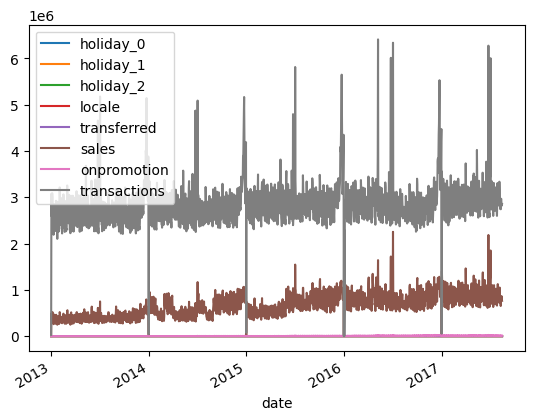

In [187]:
df_final.plot();

In [188]:
#checking for missing values 
df_final.isna().sum()

holiday_0       0
holiday_1       0
holiday_2       0
locale          0
transferred     0
sales           0
onpromotion     0
transactions    0
dtype: int64

In [189]:
##since we will be using the data to create new features, we will reset our index
df_final= df_final.reset_index()

In [190]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1703 entries, 0 to 1702
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          1703 non-null   datetime64[ns]
 1   holiday_0     1703 non-null   int64         
 2   holiday_1     1703 non-null   int64         
 3   holiday_2     1703 non-null   int64         
 4   locale        1703 non-null   float64       
 5   transferred   1703 non-null   int64         
 6   sales         1703 non-null   float64       
 7   onpromotion   1703 non-null   float64       
 8   transactions  1703 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(4)
memory usage: 119.9 KB


In [191]:
df_final['day']=df_final['date'].dt.day
df_final['month']= df_final['date'].dt.month
df_final['day_of_month']= df_final['date'].dt.day
df_final['day_of_year']= df_final['date'].dt.dayofyear
df_final['week_of_year']= df_final['date'].dt.isocalendar().week
df_final['week_of_year']= df_final['date'].dt.isocalendar().week.astype(int)
df_final['day_of_week']= df_final['date'].dt.dayofweek
df_final['is_weekend']= np.where(df_final['day_of_week'] > 4,1,0)
df_final['is_month_start']= df_final['date'].dt.is_month_start.astype(int)
df_final['is_month_end']= df_final['date'].dt.is_month_end.astype(int)
df_final['quarter']= df_final['date'].dt.quarter
df_final['is_quarter_start']= df_final['date'].dt.is_quarter_start.astype(int)
df_final['is_quarter_end']= df_final['date'].dt.is_quarter_end.astype(int)
df_final['is_year_start']= df_final['date'].dt.is_year_start.astype(int)
df_final['is_year_end']= df_final['date'].dt.is_year_end.astype(int)

In [192]:
df_final.head()

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,...,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,...,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,...,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,...,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,...,1,5,1,0,0,1,0,0,0,0


In [193]:
##We will make time our index
timed_final= df_final.set_index("date")

## Multivariate Modeling
In this section, we are going to compare one statistical method with two machine learning models.

Here we will develop a model using:
- Facebook Prophet
- SARIMAX
- Decision Trees
Again,we are trying to see if our statistical models outperform our machine learning models in multivariate

Multivariate With Facebook Prophet

In [194]:
fbp_data= df_final.copy()

In [195]:
fbp_data= fbp_data.rename(columns={"date": "ds", "sales": "y"})

In [196]:
fbp_data.head()

,ds,holiday_0,holiday_1,holiday_2,locale,transferred,y,onpromotion,transactions,day,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,...,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,...,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,...,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,...,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,...,1,5,1,0,0,1,0,0,0,0


### Data Splitting For Facebook Prophet

In [197]:
#first, let's get our exogenous and endogenous variables
fbp_exo= fbp_data.drop(["y", "ds"], axis= 1)
fbp_endo= fbp_data.y

In [198]:
fbp_train, fbp_test= train_test_split(fbp_data, test_size= 0.2, shuffle= False)

In [199]:
fbp_test.shape

(341, 23)

In [200]:
model_3= Prophet(interval_width= 0.95, yearly_seasonality= True)

In [201]:
exo_cols= ['day', 'month', 'day_of_month', 'day_of_year', 'week_of_year', 'day_of_week', 'is_weekend', 
           'is_month_start', 'is_month_end',
           'quarter', 'is_quarter_start', 'is_quarter_end', 'is_year_start', 'is_year_end']

In [202]:
for cols in exo_cols:
    model_3.add_regressor(cols, standardize= False)

In [203]:
pd.DataFrame(model_3.extra_regressors)

,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
prior_scale,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0
standardize,False,False,False,False,False,False,False,False,False,False,False,False,False,False
mu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mode,additive,additive,additive,additive,additive,additive,additive,additive,additive,additive,additive,additive,additive,additive


In [204]:
model_3.fit(fbp_train)

08:02:55 - cmdstanpy - INFO - Chain [1] start processing
08:03:00 - cmdstanpy - INFO - Chain [1] done processing


In [205]:
model_3.params

OrderedDict([('lp__', array([[3431.]])),
             ('k', array([[0.221383]])),
             ('m', array([[0.0166868]])),
             ('delta',
              array([[-0.0569586 , -0.021068  , -0.0075669 ,  0.00110566,  0.0154937 ,
                       0.0925481 ,  0.0729043 ,  0.00053419, -0.00102972, -0.0574688 ,
                      -0.00315568, -0.0320275 , -0.0341617 , -0.060509  , -0.0685685 ,
                      -0.00993612,  0.0272017 ,  0.185153  ,  0.197292  ,  0.0402154 ,
                      -0.00042327, -0.0689467 , -0.108378  , -0.113764  , -0.139999  ]])),
             ('sigma_obs', array([[0.0472408]])),
             ('beta',
              array([[ 5.92634e-03,  1.58859e-02,  1.94570e-03,  1.19790e-02,
                       2.41258e-03,  6.08653e-03, -1.69012e-02,  1.95957e-02,
                      -4.82074e-03,  1.78867e-03,  9.37319e-04,  8.94441e-03,
                      -2.21545e-03,  1.74876e-03, -8.72236e-03, -4.81623e-05,
                      -5.20652

In [206]:
#We want to get only the exogenous variables and the date without the target 
test_values= fbp_test.drop("y", axis= 1)
test_values.head()

,ds,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions,day,month,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
1362,2016-09-12,0,1,0,3.0,0,5902.0,2545125.0,12,9,...,37,0,0,0,0,3,0,0,0,0
1363,2016-09-13,0,1,0,3.0,0,7836.0,2443056.0,13,9,...,37,1,0,0,0,3,0,0,0,0
1364,2016-09-14,0,1,0,3.0,0,13238.0,2412168.0,14,9,...,37,2,0,0,0,3,0,0,0,0
1365,2016-09-15,0,1,0,3.0,0,8373.0,2466453.0,15,9,...,37,3,0,0,0,3,0,0,0,0
1366,2016-09-16,0,1,0,3.0,0,14453.0,2666037.0,16,9,...,37,4,0,0,0,3,0,0,0,0


In [207]:
eval_3= model_3.predict(test_values)

In [208]:
model_3_eval_data= eval_3[["ds", "yhat"]]
model_3_eval_data.head()

,ds,yhat
0,2016-09-12,834769.332642
1,2016-09-13,794646.520856
2,2016-09-14,811976.589641
3,2016-09-15,737511.352031
4,2016-09-16,792188.123226


In [209]:
#Let's get only the sales and time of both for better evaluation
model_3_train_data= fbp_train[["ds", "y"]]
model_3_test_data= fbp_test[["ds", "y"]]

In [210]:
##Let's make the time the index for easy evaluation
model_3_train_data= model_3_train_data.set_index("ds")
model_3_test_data= model_3_test_data.set_index("ds")
model_3_eval_data= model_3_eval_data.set_index("ds")

### Using facebook prophet

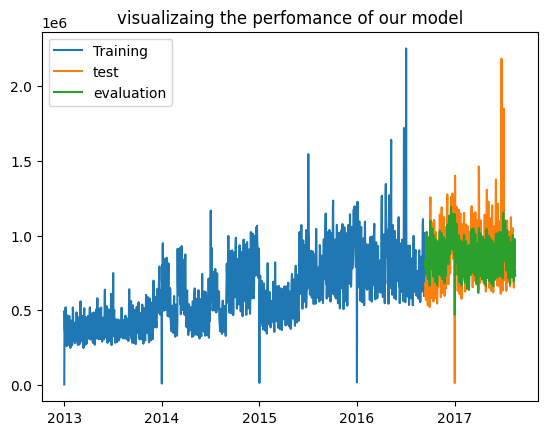

In [211]:
plt.plot(model_3_train_data, label= "Training")
plt.plot(model_3_test_data, label= "test")
plt.plot(model_3_eval_data, label= "evaluation")
plt.legend()
plt.title("visualizaing the perfomance of our model");

In [212]:
MEA_error_3= (MAE(model_3_test_data, model_3_eval_data)/model_3_test_data.mean())* 100
RMSLE_error_3= np.sqrt(MSLE(model_3_test_data, model_3_eval_data))
error_3= pd.DataFrame([["Facebook Prophet with exo", MEA_error_3, RMSLE_error_3]], columns= ["Model", "MAE", "RMSLE"])
               
error_3

,Model,MAE,RMSLE
0,Facebook Prophet with exo,y 9.902208 dtype: float64,0.235862


## Assumption:
For us to make our forecast, we will have to get the future values for our exogenous features. This can be a tedious work since the features are numerous; therefore, what we will do is to use the previous values of the exogenous variables in our test data and use that for our forecast
## Multivariate modelling with Sarimax

In [213]:
df_final.head()

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,...,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,...,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,...,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,...,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,...,1,5,1,0,0,1,0,0,0,0


In [214]:
##agian, we are going to resample by week 
df_weekly= df_final.set_index("date")
df_weekly= df_weekly.resample("W").median()
df_weekly.to_csv('Documents/df_weekly.csv')
df_weekly.head()

,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,month,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
date,,,,,,,,,,,,,,,,,,,,,
2013-01-06,0.0,1.0,0.0,3.0,0.0,419405.676176,0.0,2787972.0,3.5,1.0,...,1.0,3.5,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-13,0.0,1.0,0.0,3.0,0.0,318347.777981,0.0,2386725.0,10.0,1.0,...,2.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-20,0.0,1.0,0.0,3.0,0.0,299129.549954,0.0,2355243.0,17.0,1.0,...,3.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-27,0.0,1.0,0.0,3.0,0.0,296214.728983,0.0,2352009.0,24.0,1.0,...,4.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-03,0.0,1.0,0.0,3.0,0.0,285460.169953,0.0,2339304.0,28.0,1.0,...,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [215]:
df_weekly_endog= df_weekly[["sales"]]
df_weekly_exog= df_weekly.drop("sales", axis= 1)

In [216]:
df_weekly_endog.head()

,sales
date,
2013-01-06,419405.676176
2013-01-13,318347.777981
2013-01-20,299129.549954
2013-01-27,296214.728983
2013-02-03,285460.169953


In [217]:
##data splitting
endog_train, endog_test= train_test_split(df_weekly_endog, test_size= 0.2, shuffle= False)
exog_train, exog_test= train_test_split(df_weekly_exog, test_size= 0.2, shuffle= False)

In [218]:
endog_test.head()

,sales
date,
2016-09-18,678776.459126
2016-09-25,666928.400013
2016-10-02,664217.440294
2016-10-09,797612.239327
2016-10-16,667954.207226


In [219]:
endog_train

,sales
date,
2013-01-06,419405.676176
2013-01-13,318347.777981
2013-01-20,299129.549954
2013-01-27,296214.728983
2013-02-03,285460.169953
...,...
2016-08-14,714905.919067
2016-08-21,720032.299881
2016-08-28,674613.047950


In [220]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [221]:
model_4= SARIMAX(endog=endog_train, exog=exog_train, order=(2, 1, 1), seasonal_order=(1, 0, 0, 52), frequency= "W")

In [222]:
Model_4=model_4.fit()

In [223]:
eval_4= Model_4.predict( start= "2016-09-18", end="2017-08-20", exog=exog_test)

In [224]:
eval_4= pd.DataFrame(eval_4)

In [225]:
eval_4.columns= ["sales"]
eval_4.head()

,sales
2016-09-18,710704.635654
2016-09-25,706494.581309
2016-10-02,663425.476426
2016-10-09,739982.218154
2016-10-16,710298.409541


### Visualizing The Perfomance of Our Model

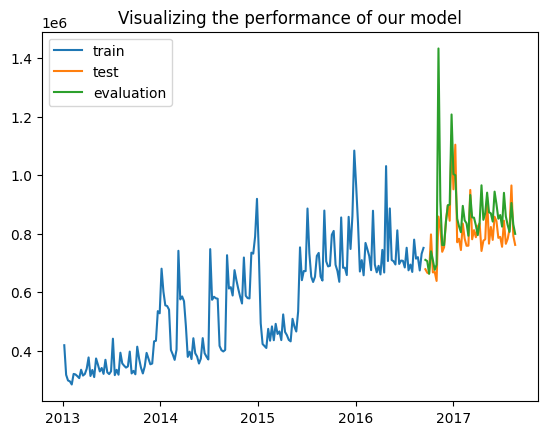

In [226]:
plt.plot(endog_train, label= "train")
plt.plot(endog_test, label= "test")
plt.plot(eval_4, label= "evaluation")
plt.title("Visualizing the performance of our model")
plt.legend()

In [227]:
MEA_error_4= (MAE(endog_test, eval_4)/endog_test.mean())* 100
RMSLE_error_4= np.sqrt(MSLE(endog_test, eval_4))
error_4= pd.DataFrame([["SARIMAX", MEA_error_4, RMSLE_error_4]], columns= ["Model", "MAE", "RMSLE"])
               
error_4

,Model,MAE,RMSLE
0,SARIMAX,sales 8.082758 dtype: float64,0.107012


#### Forecasting With Sarimax

In [228]:
exog_test.head()

,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions,day,month,day_of_month,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
date,,,,,,,,,,,,,,,,,,,,,
2016-09-18,0.0,1.0,0.0,3.0,0.0,9645.0,2545125.0,15.0,9.0,15.0,...,37.0,3.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0
2016-09-25,0.0,1.0,0.0,3.0,0.0,10902.0,2526876.0,22.0,9.0,22.0,...,38.0,3.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0
2016-10-02,0.0,1.0,0.0,3.0,0.0,10009.0,2476650.0,27.0,9.0,27.0,...,39.0,3.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0
2016-10-09,0.0,1.0,0.0,3.0,0.0,10957.0,2631321.0,6.0,10.0,6.0,...,40.0,3.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0
2016-10-16,0.0,1.0,0.0,3.0,0.0,11029.0,2563803.0,13.0,10.0,13.0,...,41.0,3.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0


In [229]:
forecast_date_4= pd.date_range("2017-08-21", periods=49, freq='W')
forecast_date_4= pd.DataFrame(forecast_date_4)
forecast_date_4.columns= ["date"]
forecast_date_4.tail()

,date
44,2018-07-01
45,2018-07-08
46,2018-07-15
47,2018-07-22
48,2018-07-29


### Multivariate Modelling with Machine Learning Models¶
In this section, we will take a look at three models:
- Decision Tree
- Random Forest

In [230]:
df_final.head()

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,...,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,...,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,...,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,...,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,...,1,5,1,0,0,1,0,0,0,0


### Data Splitting

In [231]:
final=df_final.copy()
final.head()

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,...,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,...,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,...,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,...,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,...,1,5,1,0,0,1,0,0,0,0


In [232]:
#We will have to drop the date before proceeding:  
final= df_final.drop("date", axis= 1)

In [233]:
X= final.drop("sales", axis= 1)
Y= final[["sales"]]

In [234]:
X.head()

,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions,day,month,day_of_month,...,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,0,0,1,0.0,0,0.0,25410.0,1,1,1,...,1,1,0,1,0,1,1,0,1,0
1,0,1,0,3.0,0,0.0,3076095.0,2,1,2,...,1,2,0,0,0,1,0,0,0,0
2,0,1,0,3.0,0,0.0,2590632.0,3,1,3,...,1,3,0,0,0,1,0,0,0,0
3,0,1,0,3.0,0,0.0,2590302.0,4,1,4,...,1,4,0,0,0,1,0,0,0,0
4,0,1,1,0.0,0,0.0,3087909.0,5,1,5,...,1,5,1,0,0,1,0,0,0,0


In [235]:
Y.head()

,sales
0,2511.618999
1,496092.417944
2,361461.231124
3,354459.677093
4,477350.121229


In [236]:
X_train, X_test= train_test_split(X, test_size= 0.2, shuffle= False)
Y_train, Y_test= train_test_split(Y, test_size= 0.2, shuffle= False)

#### Decision Tree

In [237]:
from sklearn.tree import DecisionTreeRegressor

In [238]:
decision_tree= DecisionTreeRegressor()

In [239]:
decision_tree.fit(X_train, Y_train)

DecisionTreeRegressor()

In [240]:
result_5=  decision_tree.predict(X_test)

In [241]:
MEA_error_5= (MAE(Y_test, result_5)/ Y_test.mean())* 100
RMSLE_error_5= np.sqrt(MSLE(Y_test, result_5))
error_5= pd.DataFrame([["Decision Tree", MEA_error_5, RMSLE_error_5]], columns= ["Model", "MAE", "RMSLE"])
               
error_5

,Model,MAE,RMSLE
0,Decision Tree,sales 8.105561 dtype: float64,0.120772


In [242]:
from sklearn.ensemble import RandomForestRegressor

In [243]:
rf= RandomForestRegressor(n_estimators=300, max_depth= 5, random_state= 18, max_features= "sqrt").fit(X_train, Y_train)

In [244]:
result_6= rf.predict(X_test)

In [245]:
MEA_error_6= (MAE(Y_test, result_6)/ Y_test.mean())* 100
RMSLE_error_6= np.sqrt(MSLE(Y_test, result_6))
error_6= pd.DataFrame([["Random Forest", MEA_error_6, RMSLE_error_6]], columns= ["Model", "MAE", "RMSLE"])
               
error_6

,Model,MAE,RMSLE
0,Random Forest,sales 16.424422 dtype: float64,0.270531


- from the above the best performing model for our project is SARIMAX

### OLS (Ordinary Least Squares) 

In [246]:
import statsmodels.api as sm
# Create the regression model
model = sm.formula.ols('sales ~ onpromotion', data= merged_data).fit()

# Print the model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.183
Model:                            OLS   Adj. R-squared:                  0.183
Method:                 Least Squares   F-statistic:                 6.859e+05
Date:                Tue, 13 Jun 2023   Prob (F-statistic):               0.00
Time:                        08:04:10   Log-Likelihood:            -2.5434e+07
No. Observations:             3054348   AIC:                         5.087e+07
Df Residuals:                 3054346   BIC:                         5.087e+07
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept     257.7417      0.585    440.241      

In [247]:
import statsmodels.api as sm

# Create the regression model
model = sm.formula.ols('sales ~ onpromotion +transactions', data= df_final).fit()

# Print the model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.660
Model:                            OLS   Adj. R-squared:                  0.660
Method:                 Least Squares   F-statistic:                     1651.
Date:                Tue, 13 Jun 2023   Prob (F-statistic):               0.00
Time:                        08:04:10   Log-Likelihood:                -22642.
No. Observations:                1703   AIC:                         4.529e+04
Df Residuals:                    1700   BIC:                         4.531e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept    -2.807e+05   2.06e+04    -13.610   

## Machine Learning Modeling

Here is the section to build, train, evaluate and compare the models to each others.

### Create the Model

In [248]:
final_dataset=pd.read_csv("C:/Users/DAVID/Downloads/Documents/final_dataset.csv")
final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1703 entries, 0 to 1702
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          1703 non-null   object 
 1   holiday       1703 non-null   object 
 2   locale        1703 non-null   object 
 3   transferred   1703 non-null   bool   
 4   sales         1703 non-null   float64
 5   onpromotion   1703 non-null   float64
 6   transactions  1703 non-null   float64
dtypes: bool(1), float64(3), object(3)
memory usage: 81.6+ KB


In [249]:
print(final_dataset.columns)

Index(['date', 'holiday', 'locale', 'transferred', 'sales', 'onpromotion',
       'transactions'],
      dtype='object')


In [250]:
data =final_dataset

In [251]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_log_error

### Train the Model

In [252]:
# define the columns to be onehot encoded
columns_to_encode = ['date','holiday','locale','transferred']

# create the onehot encoder object
encoder = OneHotEncoder(categories='auto', sparse=False)

# fit the encoder on the data
encoder.fit(data[columns_to_encode])

# encode the columns and create new column names
encoded_columns = encoder.transform(data[columns_to_encode])
feature_names = []
for col, cats in zip(columns_to_encode, encoder.categories_):
    for cat in cats:
        feature_names.append(f"{col}_{cat}")
        
# create a new dataframe with the encoded columns
encoded_data = pd.DataFrame(encoded_columns, columns=feature_names)

# concatenate the encoded columns with the original dataset
data_encoded = pd.concat([data, encoded_data], axis=1)

# drop the original columns that were encoded
data_encoded.drop(columns_to_encode, axis=1, inplace=True)

# print the first 5 rows of the encoded dataset
print(data_encoded.head())

           sales  onpromotion  transactions  date_2013-01-01  date_2013-01-02  \
0    2511.618999          0.0       25410.0              1.0              0.0   
1  496092.417944          0.0     3076095.0              0.0              1.0   
2  361461.231124          0.0     2590632.0              0.0              0.0   
3  354459.677093          0.0     2590302.0              0.0              0.0   
4  477350.121229          0.0     3087909.0              0.0              0.0   

   date_2013-01-03  date_2013-01-04  date_2013-01-05  date_2013-01-06  \
0              0.0              0.0              0.0              0.0   
1              0.0              0.0              0.0              0.0   
2              1.0              0.0              0.0              0.0   
3              0.0              1.0              0.0              0.0   
4              0.0              0.0              1.0              0.0   

   date_2013-01-07  ...  holiday_Holiday  holiday_Not Holiday  \
0        

In [253]:
data=data_encoded

In [254]:
# Convert index to datetime
data.index = pd.to_datetime(data.index)

In [255]:
# Split data into train and test sets
train_size = int(len(data) * 0.8)
train, test = data.iloc[:train_size,:], data.iloc[train_size:,:]

In [256]:
# Scale data
scaler = MinMaxScaler(feature_range=(0, 1))
train_scaled = scaler.fit_transform(train)
test_scaled = scaler.transform(test)

In [257]:
train_scaled

array([[0.        , 0.        , 0.00396368, ..., 0.        , 1.        ,
        0.        ],
       [0.21927999, 0.        , 0.47983672, ..., 0.        , 1.        ,
        0.        ],
       [0.15946825, 0.        , 0.40410987, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.29164014, 0.53255402, 0.40977227, ..., 0.        , 1.        ,
        0.        ],
       [0.40580236, 0.30714419, 0.48446959, ..., 0.        , 1.        ,
        0.        ],
       [0.45086431, 0.33471498, 0.47157476, ..., 0.        , 1.        ,
        0.        ]])

In [258]:
# Prepare data for LSTM model
def prepare_data(data, lags=1):
    X, y = [], []
    for i in range(lags, len(data)):
        X.append(data[i-lags:i, :])
        y.append(data[i, :])
    X, y = np.array(X), np.array(y)
    return X, y

lags = 3 # number of lagged time steps to use
X_train, y_train = prepare_data(train_scaled, lags=lags)
X_test, y_test = prepare_data(test_scaled, lags=lags)

In [259]:
# Build LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(y_train.shape[1]))
model.compile(loss='mse', optimizer='adam')

In [260]:
# Train LSTM model
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1)
history = model.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test), verbose=2, callbacks=[early_stopping], shuffle=False)

Epoch 1/50
22/22 - 10s - loss: 0.0024 - val_loss: 0.0024 - 10s/epoch - 457ms/step
Epoch 2/50
22/22 - 1s - loss: 0.0018 - val_loss: 0.0013 - 993ms/epoch - 45ms/step
Epoch 3/50
22/22 - 1s - loss: 0.0011 - val_loss: 0.0011 - 878ms/epoch - 40ms/step
Epoch 4/50
22/22 - 1s - loss: 9.7648e-04 - val_loss: 0.0011 - 936ms/epoch - 43ms/step
Epoch 5/50
22/22 - 1s - loss: 9.6187e-04 - val_loss: 0.0011 - 836ms/epoch - 38ms/step
Epoch 6/50
22/22 - 1s - loss: 9.5530e-04 - val_loss: 0.0011 - 946ms/epoch - 43ms/step
Epoch 7/50
22/22 - 1s - loss: 9.5108e-04 - val_loss: 0.0011 - 789ms/epoch - 36ms/step
Epoch 8/50
22/22 - 1s - loss: 9.4769e-04 - val_loss: 0.0011 - 938ms/epoch - 43ms/step
Epoch 9/50
22/22 - 1s - loss: 9.4411e-04 - val_loss: 0.0011 - 813ms/epoch - 37ms/step
Epoch 10/50
22/22 - 1s - loss: 9.4036e-04 - val_loss: 0.0011 - 922ms/epoch - 42ms/step
Epoch 11/50
22/22 - 1s - loss: 9.3627e-04 - val_loss: 0.0011 - 802ms/epoch - 36ms/step
Epoch 12/50
22/22 - 1s - loss: 9.3168e-04 - val_loss: 0.0011 - 9

### Evaluate the Model on the Evaluation dataset (Evalset)

In [261]:
# Compute the valid metrics for the use case # Optional: show the classification report 
# Evaluate LSTM model on test set
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print('Test RMSE:', rmse)

11/11 [==============================] - 1s 10ms/step
Test RMSE: 0.032926672431072834


In [262]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

In [263]:
# Split data into X and y
X_train, y_train = train.drop('sales', axis=1), train['sales']
X_test, y_test = test.drop('sales', axis=1), test['sales']

# Train XGBoost model
model = xgb.XGBRegressor()
model.fit(X_train, y_train)

# Evaluate XGBoost model on test set
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print('Test RMSE:', rmse)

Test RMSE: 99455.65519095246


In [264]:
# Calculate the mean of the test dataset
test_mean = np.mean(y_test)

# Print the mean and Test RMSE values
print('Mean of test dataset:', test_mean)
print('Test RMSE:', rmse)

# Compare the mean to Test RMSE
if rmse < test_mean:
    print('The model has lower error than the mean of the test dataset.')
else:
    print('The model has higher error than the mean of the test dataset.')


Mean of test dataset: 855278.3644171058
Test RMSE: 99455.65519095246
The model has lower error than the mean of the test dataset.


### Models comparison

In [265]:
result= pd.concat([error_6, error_5, error_4, error_3, error_2,error_1])

In [266]:
result= result.reset_index()

In [267]:
result = result.sort_values(by= "RMSLE")

In [268]:
result

,index,Model,MAE,RMSLE
2,0,SARIMAX,sales 8.082758 dtype: float64,0.107012
5,0,SARIMA,sales 8.766755 dtype: float64,0.109081
1,0,Decision Tree,sales 8.105561 dtype: float64,0.120772
3,0,Facebook Prophet with exo,y 9.902208 dtype: float64,0.235862
0,0,Random Forest,sales 16.424422 dtype: float64,0.270531
4,0,Facebook Prophet,sales 11.017831 dtype: float64,0.277652


In [269]:
final_dataset.head()

,date,holiday,locale,transferred,sales,onpromotion,transactions
0,2013-01-01,Holiday,National,False,2511.618999,0.0,25410.0
1,2013-01-02,Not Holiday,Not Holiday,False,496092.417944,0.0,3076095.0
2,2013-01-03,Not Holiday,Not Holiday,False,361461.231124,0.0,2590632.0
3,2013-01-04,Not Holiday,Not Holiday,False,354459.677093,0.0,2590302.0
4,2013-01-05,Work Day,National,False,477350.121229,0.0,3087909.0


In [270]:
x= final_dataset.loc[0:10]
sample= x[['date','holiday','locale','sales']]
sample

,date,holiday,locale,sales
0,2013-01-01,Holiday,National,2511.618999
1,2013-01-02,Not Holiday,Not Holiday,496092.417944
2,2013-01-03,Not Holiday,Not Holiday,361461.231124
3,2013-01-04,Not Holiday,Not Holiday,354459.677093
4,2013-01-05,Work Day,National,477350.121229
5,2013-01-06,Not Holiday,Not Holiday,519695.401088
6,2013-01-07,Not Holiday,Not Holiday,336122.801066
7,2013-01-08,Not Holiday,Not Holiday,318347.777981
8,2013-01-09,Not Holiday,Not Holiday,302530.809018
9,2013-01-10,Not Holiday,Not Holiday,258982.003049


In [271]:
final_dataset['holiday'].unique()

array(['Holiday', 'Not Holiday', 'Work Day', 'Additional', 'Event',
       'Transfer', 'Bridge'], dtype=object)

In [272]:
final_dataset['locale'].unique()

array(['National', 'Not Holiday', 'Local', 'Regional'], dtype=object)

In [274]:
rank = {"National": 0, "Regional": 1, "Local": 2, "Not Holiday": 3}
# Create an OrdinalEncoder with the specified categories
encoder_2 = OrdinalEncoder(categories=[list(rank.keys())])
encoded_data_1['locale'] = encoder_2.fit_transform(encoded_data_1[['locale']])


In [275]:
encoded_data_1.set_index("date")

,holiday_0,holiday_1,locale,sales
date,,,,
2013-01-01,0,1,0.0,2511.618999
2013-01-02,1,0,3.0,496092.417944
2013-01-03,1,0,3.0,361461.231124
2013-01-04,1,0,3.0,354459.677093
2013-01-05,1,1,0.0,477350.121229
2013-01-06,1,0,3.0,519695.401088
2013-01-07,1,0,3.0,336122.801066
2013-01-08,1,0,3.0,318347.777981
2013-01-09,1,0,3.0,302530.809018


In [276]:
df_endog= encoded_data_1[["sales"]]
df_exog= encoded_data_1.drop("sales", axis= 1)

In [277]:
##data splitting
end_train, end_test= train_test_split(df_endog, test_size= 0.2, shuffle= False)
exo_train, exo_test= train_test_split(df_exog, test_size= 0.2, shuffle= False)

In [287]:
print("end_train shape:", end_train.shape)
print("end_test shape:", end_test.shape)
print("exo_train shape:", exo_train.shape)
print("exo_test shape:", exo_test.shape)


end_train shape: (8, 1)
end_test shape: (3, 1)
exo_train shape: (8, 4)
exo_test shape: (3, 4)


In [278]:
end_train

,sales
0,2511.618999
1,496092.417944
2,361461.231124
3,354459.677093
4,477350.121229
5,519695.401088
6,336122.801066
7,318347.777981


In [279]:
exo_train

,date,holiday_0,holiday_1,locale
0,2013-01-01,0,1,0.0
1,2013-01-02,1,0,3.0
2,2013-01-03,1,0,3.0
3,2013-01-04,1,0,3.0
4,2013-01-05,1,1,0.0
5,2013-01-06,1,0,3.0
6,2013-01-07,1,0,3.0
7,2013-01-08,1,0,3.0


In [290]:
# Generate predictions using the model and prediction dates
sample_eval = Model_4.predict(start=exo_test.index[0], end=exo_test.index[-1], exog=exo_test)

# Continue with calculating errors and creating the dataframe
MEA_sample_error = (MAE(end_test, sample_eval) / end_test.mean()) * 100
RMSLE_sample_error = np.sqrt(MSLE(end_test, sample_eval))
sample_error = pd.DataFrame([["SARIMAX", MEA_sample_error, RMSLE_sample_error]], columns=["Model", "MAE", "RMSLE"])
sample_error

,Model,MAE,RMSLE
0,SARIMAX,sales 23.435545 dtype: float64,0.287429


In [299]:
import pickle
data= {'model':Model_4,'encoder':encoded_data_1 , 'encoder2': encoder_2}
with open('saved_ml.pkl','wb') as file:
    pickle.dump(data,file)

In [300]:
with open('saved_ml.pkl','rb') as file:
    data=pickle.load(file)
    
sarimax=data['model']
holiday_encoder= data['encoder2']
locale_encoder= data['encoder']

In [301]:
sample_eval = sarimax.predict(start=exo_test.index[0], end=exo_test.index[-1], exog=exo_test)
# Continue with calculating errors and creating the dataframe
MEA_sample_error = (MAE(end_test, sample_eval) / end_test.mean()) * 100
RMSLE_sample_error = np.sqrt(MSLE(end_test, sample_eval))
sample_error = pd.DataFrame([["SARIMAX", MEA_sample_error, RMSLE_sample_error]], columns=["Model", "MAE", "RMSLE"])
sample_error

,Model,MAE,RMSLE
0,SARIMAX,sales 23.435545 dtype: float64,0.287429


In [ ]:
#mkr dir Export
#destination= os.path.join('.', 'Export')

In [ ]:
#import pickle
# Save the SARIMAX model
#with open(os.path.join(destination,'model_4.pkl'), wb) as file:
    #pickle.dump(model_4, file)